[//]: <> (1.Introduction)
<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><center><b>DATA AUGMENTATION FOR EMPLOYEE ATTRITION PREDICTION WITH A HYBRID MODEL OF SMOTE AND WCGAN-GP</b><center><h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><b>Name :</b> Tinotenda Maisiri  <b>Reg :</b> R204576C</h2></center></div>
    
    
    
    
    
    
    
    

# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b><center>Introduction</center></b>
<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;">The <b>Notebook</b> Includes:   </div>
<ul>
	<li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Importing Neccesary Packages</b></span></li>
	<li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Importing The  Dataset</b></span></li>
	<li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>EDA</b></span></li>
	<li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Data Visualisation</b></span></li>
    <li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Data Preprocessing</b></span></li>
    <li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Building Pipeline</b></span></li>
    <li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Training Models <i>(Before Data Augmentation)</i><span style = 'color: Black' >[LogisticRegression, SVM, DecisionTree, RandomForest]</span></b></span></li>
    <li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Parameter Tuning <i>(Before Data Augmentation)</i></b></span></li>
    <li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Accuracy Evaluation <i>(Before Data Augmentation)</i></b></span></li>
    <li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Generate Synthetic Data with <span style = 'color: Black' >SMOTE & WCGAN-GP</span></b></span></li>
    <li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Assessing Data for Statistical Bias<i>(After Data Augmentation)</i></b></span></li>
    <li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Generating Training Samples<i>(After Data Augmentation)</i></b></span></li>
     <li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Training Models <i>(After Data Augmentation)</i><span style = 'color: Black' >[LogisticRegression, SVM, DecisionTree, RandomForest]</span></b></span></li>
    <li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Parameter Tuning <i>(After Data Augmentation)</i></b></span></li>
    <li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Accuracy Evaluation <i>(After Data Augmentation)</i></b></span></li>
</ul>


<div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b><center>Importing Neccessary Packages</center></b>


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option("display.max_columns",None)

import sklearn
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split


#scipy
import scipy.stats as stats

#models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

#parameter tuning and results evaluation
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score,classification_report
from sklearn.metrics import RocCurveDisplay, roc_auc_score
from tabulate import tabulate

#for SMOTE
from imblearn.over_sampling import SMOTE

import plotly.express as px

In [3]:
#wcgan-gp
from table_evaluator import TableEvaluator

import tensorflow as tf

from functools import partial
import itertools
import math

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from tensorflow.keras.layers import Input, Dense, Flatten, Dropout, Embedding, multiply, LeakyReLU
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers.legacy import Adam
import tensorflow.keras.backend as K

from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()

import warnings
warnings.simplefilter("ignore")


<div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b><center>Importing The Dataset</center></b>

In [4]:
#read the data from memory
data = pd.read_csv('data\WA_Fn-UseC_-HR-Employee-Attrition.csv')
df= data.copy()
#displAY the first and last 5 columns of the dataset
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,3,Male,41,4,2,Laboratory Technician,4,Married,2571,12290,4,Y,No,17,3,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,4,Male,42,2,3,Healthcare Representative,1,Married,9991,21457,4,Y,No,15,3,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,2,Male,87,4,2,Manufacturing Director,2,Married,6142,5174,1,Y,Yes,20,4,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,4,Male,63,2,2,Sales Executive,2,Married,5390,13243,2,Y,No,14,3,4,80,0,17,3,2,9,6,0,8



<div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b><center>Exploratory data Analysis (EDA) </center></b>

<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;">i)The <b>Data</b> Description   </div>

In [5]:
# datset information 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [6]:
# Viewing the column headings
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [7]:
#descriptive statistics that summarize the central tendency, dispersion and shape of a dataset's distribution, excluding NaN values.
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [8]:
#summary statistics for object-type (string) columns or categorial columns
df.describe(include="O")

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,Over18,OverTime
count,1470,1470,1470,1470,1470,1470,1470,1470,1470
unique,2,3,3,6,2,9,3,1,2
top,No,Travel_Rarely,Research & Development,Life Sciences,Male,Sales Executive,Married,Y,No
freq,1233,1043,961,606,882,326,673,1470,1054


In [9]:
# Printing the dimenions of data
df.shape

(1470, 35)

In [10]:
#check unique values in the column
print(df.apply(lambda col: col.unique().sum()))

Age                                                                      1677
Attrition                                                               YesNo
BusinessTravel                       Travel_RarelyTravel_FrequentlyNon-Travel
DailyRate                                                              710161
Department                         SalesResearch & DevelopmentHuman Resources
DistanceFromHome                                                          435
Education                                                                  15
EducationField              Life SciencesOtherMedicalMarketingTechnical De...
EmployeeCount                                                               1
EmployeeNumber                                                        1506552
EnvironmentSatisfaction                                                    10
Gender                                                             FemaleMale
HourlyRate                                                      

In [11]:
#check duplicates
df.duplicated().value_counts()

False    1470
Name: count, dtype: int64

In [12]:
# Identifying the unique number of values in the dataset
df.nunique()


Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

In [13]:
#look at sample of one employee 
df.sample(1).iloc[0]

Age                                             54
Attrition                                       No
BusinessTravel                       Travel_Rarely
DailyRate                                      548
Department                  Research & Development
DistanceFromHome                                 8
Education                                        4
EducationField                       Life Sciences
EmployeeCount                                    1
EmployeeNumber                                 578
EnvironmentSatisfaction                          3
Gender                                      Female
HourlyRate                                      42
JobInvolvement                                   3
JobLevel                                         2
JobRole                      Laboratory Technician
JobSatisfaction                                  3
MaritalStatus                               Single
MonthlyIncome                                 3780
MonthlyRate                    

In [14]:
# Inspecting the target variable by count
df.Attrition.value_counts()

Attrition
No     1233
Yes     237
Name: count, dtype: int64

In [15]:
# check the target value "Atrrition"

left_emps = round((df["Attrition"][df['Attrition']=='Yes'].count()/df['Attrition'].count())*100 ,2)
#stayed_emps = round((df["Attrition"][df['Attrition']=='No'].count()/df['Attrition'].count())*100 ,2)
stayed_emps = 100 - left_emps
print(f"Percentage of Employee who quit: %{left_emps}")
print(f"Percentage of Employee who stayed: %{stayed_emps}")

Percentage of Employee who quit: %16.12
Percentage of Employee who stayed: %83.88


In [16]:
#inspecting the data types
df.dtypes

Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

In [17]:
## check the values for categorical features
for i in df.select_dtypes(include='O'):
    print(f"column name: {i}")
    print(df[i].value_counts())
    print("\n")

column name: Attrition
Attrition
No     1233
Yes     237
Name: count, dtype: int64


column name: BusinessTravel
BusinessTravel
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: count, dtype: int64


column name: Department
Department
Research & Development    961
Sales                     446
Human Resources            63
Name: count, dtype: int64


column name: EducationField
EducationField
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: count, dtype: int64


column name: Gender
Gender
Male      882
Female    588
Name: count, dtype: int64


column name: JobRole
JobRole
Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources       

In [18]:
## check the values for numerical features
for i in df.select_dtypes(exclude='O'):
    print(f"column name: {i}")
    print(df[i].value_counts())
    print("\n")

column name: Age
Age
35    78
34    77
36    69
31    69
29    68
32    61
30    60
33    58
38    58
40    57
37    50
27    48
28    48
42    46
39    42
45    41
41    40
26    39
44    33
46    33
43    32
50    30
25    26
24    26
49    24
47    24
55    22
51    19
53    19
48    19
54    18
52    18
22    16
56    14
23    14
58    14
21    13
20    11
59    10
19     9
18     8
60     5
57     4
Name: count, dtype: int64


column name: DailyRate
DailyRate
691     6
408     5
530     5
1329    5
1082    5
       ..
650     1
279     1
316     1
314     1
628     1
Name: count, Length: 886, dtype: int64


column name: DistanceFromHome
DistanceFromHome
2     211
1     208
10     86
9      85
3      84
7      84
8      80
5      65
4      64
6      59
16     32
11     29
24     28
23     27
29     27
15     26
18     26
26     25
25     25
20     25
28     23
19     22
14     21
12     20
17     20
22     19
13     19
21     18
27     12
Name: count, dtype: int64


column name: Ed

<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><b>Primary</b> Insights  </div>



In [19]:
# Import libraries
import pandas as pd
import numpy as np

# Load your data
data = pd.read_csv('data\WA_Fn-UseC_-HR-Employee-Attrition.csv')  # Replace with your data path

# Function to check missing values
def check_missing_values(df):
  """
  This function checks for missing values in a pandas dataframe

  Args:
      df (pandas.DataFrame): The dataframe to check

  Returns:
      pandas.DataFrame: A dataframe showing missing value counts for each column
  """
  missing_values = df.isnull().sum()
  missing_values_pct = (missing_values / len(df)) * 100
  return pd.DataFrame({'Missing Values': missing_values, '% Missing': missing_values_pct})

# Function to check data types
def check_data_types(df):
  """
  This function checks the data types of all columns in a pandas dataframe

  Args:
      df (pandas.DataFrame): The dataframe to check

  Returns:
      pandas.Series: A Series showing the data type for each column
  """
  return df.dtypes

# Function to check for outliers (using IQR)
def check_outliers(df, col):
  """
  This function checks for outliers in a specific column of a pandas dataframe using IQR

  Args:
      df (pandas.DataFrame): The dataframe to check
      col (str): The column name to check for outliers

  Returns:
      int: The number of outliers found in the column
  """
  Q1 = df[col].quantile(0.25)
  Q3 = df[col].quantile(0.75)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
  return len(outliers)

# Generate report

# Missing values report
missing_values_df = check_missing_values(data.copy())
print("Missing Values Report:")
display(missing_values_df)

# Data types report
data_types_df = check_data_types(data.copy())
print("Data Types Report:")
display(data_types_df)

# Check for outliers (modify this section to check specific columns)
outliers_in_age = check_outliers(data.copy(), "Age")
print(f"Number of outliers in 'Age' column: {outliers_in_age}")

Missing Values Report:


,Missing Values,% Missing
Age,0,0.0
Attrition,0,0.0
BusinessTravel,0,0.0
DailyRate,0,0.0
Department,0,0.0
DistanceFromHome,0,0.0
Education,0,0.0
EducationField,0,0.0
EmployeeCount,0,0.0
EmployeeNumber,0,0.0


Data Types Report:


Age                          int64
Attrition                   object
BusinessTravel              object
DailyRate                    int64
Department                  object
DistanceFromHome             int64
Education                    int64
EducationField              object
EmployeeCount                int64
EmployeeNumber               int64
EnvironmentSatisfaction      int64
Gender                      object
HourlyRate                   int64
JobInvolvement               int64
JobLevel                     int64
JobRole                     object
JobSatisfaction              int64
MaritalStatus               object
MonthlyIncome                int64
MonthlyRate                  int64
NumCompaniesWorked           int64
Over18                      object
OverTime                    object
PercentSalaryHike            int64
PerformanceRating            int64
RelationshipSatisfaction     int64
StandardHours                int64
StockOptionLevel             int64
TotalWorkingYears   

Number of outliers in 'Age' column: 0


- "DailyRate" refers to how much paid based on the "HourlyRate"
- "MonthlyIncome" refers to the income per month SO, what does "MonthlyRate" refer to?
- we have to check these three columns to determine what is the relationship between them ['DailyRate','MonthlyIncome,'MonthlyRate']
- NO NULLS & NO DUPLICATED 
- ["Attrition"] is the target variable
- "Over18" column has only one unique value -> will be dropped because it will not help in our analysis

In [20]:
#All Numerical Columns
Nums = ['Age','Attrition','EnvironmentSatisfaction','JobInvolvement','JobLevel','JobSatisfaction','MonthlyIncome',
       'StockOptionLevel','TotalWorkingYears','YearsAtCompany','YearsInCurrentRole','YearsWithCurrManager']


<div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b><center>Data Visualisation </center></b>


<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><b>1)</b> Target<b> Variable</b> By <b>Percantage</b></h2></div>


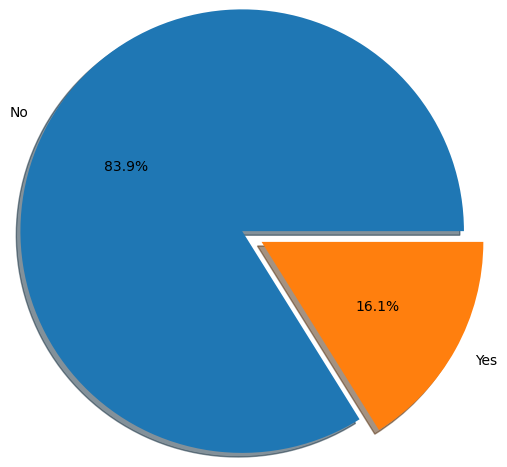

In [21]:
r = df.groupby('Attrition')['Attrition'].count()
print("\n")


plt.pie(r, explode=[0.05, 0.1], labels=['No', 'Yes'],radius=1.5, autopct='%1.1f%%',  shadow=True);


<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><b>2)</b> Age <b> Distribution</b> Across<b> Dataset</b></h2></div>


In [22]:
# Grouping numerical vs categorical columns in dataset
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

#Calculating Z score to detect data points away from mean.
#Creating a Data frame to sore the z value.
z_dict =dict()
for col in numeric_cols:
    z_cont = np.abs(stats.zscore(df[col]))
    z_dict[col] = z_cont
z_val_df = pd.DataFrame(z_dict)
#print(z_val_df.head(5))

<Axes: xlabel='Age', ylabel='Density'>

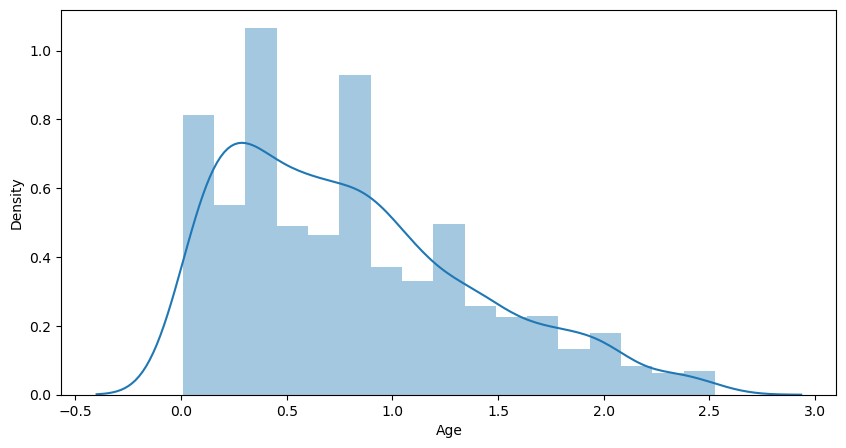

In [23]:
plt.figure(figsize = (10,5))
sns.distplot(z_val_df['Age'])

<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><b>2)</b> All <b> Distribution</b> Across<b> Dataset</b></h2></div>

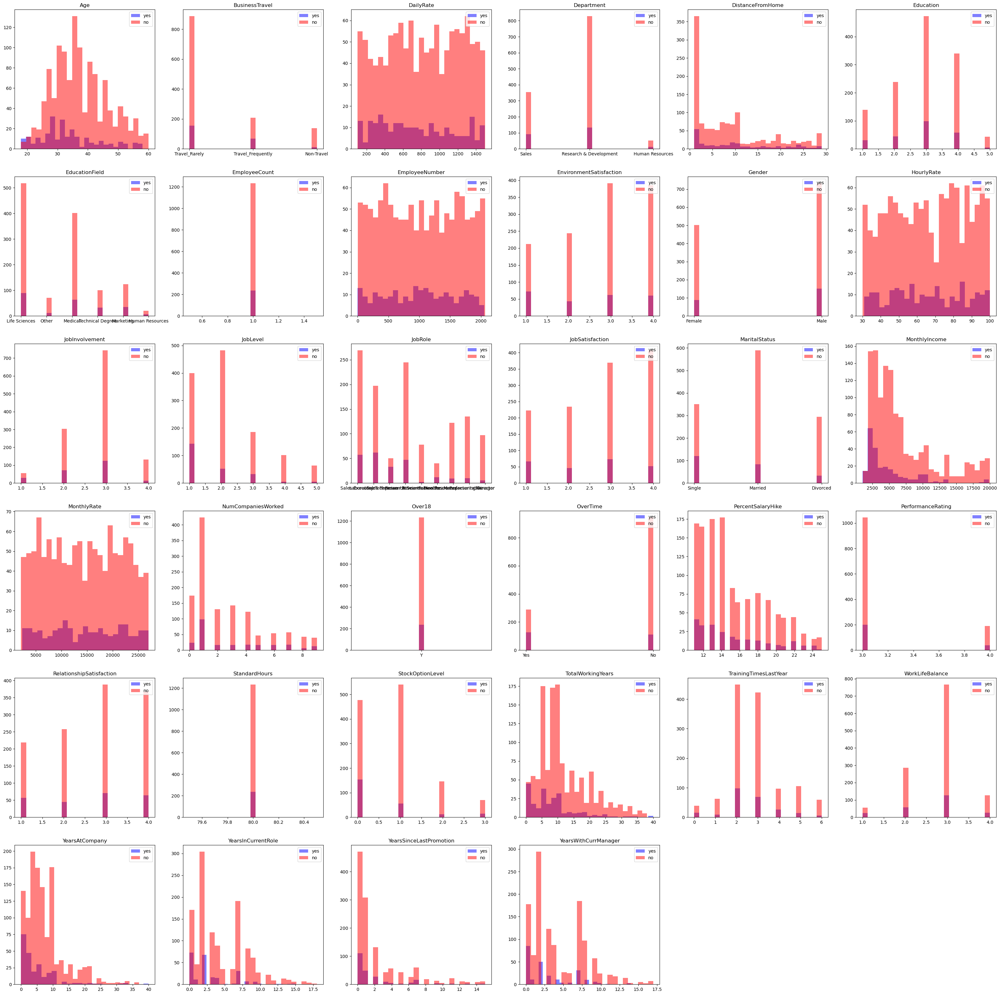

In [24]:
#plot distributions
k=1
plt.figure(figsize=(40,40))
for col in data:
  if col=="Attrition":
    continue
  yes = df[df['Attrition'] == 'Yes'][col]
  no = df[df['Attrition'] == 'No'][col]
  plt.subplot(6, 6, k)
  plt.hist(yes, bins=25, alpha=0.5, label='yes', color='b')
  plt.hist(no, bins=25, alpha=0.5, label='no', color='r')
  plt.legend(loc='upper right')
  plt.title(col)
  k+=1

<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><b>3)</b> Detecting <b> Of</b> Outliers<b> Using<b> BoxPlot</b> </h2></div>

In [25]:
#Checking columns with ouliers.
outliers = {}

for col in df.select_dtypes(include=np.number).columns:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    col_outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
    outliers[col] = col_outliers


print("Summary Statistics for HR attributes:")
print(tabulate(df.describe(), headers='keys', tablefmt='pretty'))

for col, outlier_data in outliers.items():
    if len(outlier_data) == 0:
      continue
    else:
      print(f"Outliers in {col}:", len(outlier_data))
      print(tabulate(outlier_data.head(), headers='keys', tablefmt='pretty'))

Summary Statistics for HR attributes:
+-------+--------------------+--------------------+-------------------+--------------------+---------------+-------------------+-------------------------+--------------------+--------------------+--------------------+--------------------+-------------------+--------------------+--------------------+--------------------+---------------------+--------------------------+---------------+--------------------+--------------------+-----------------------+--------------------+--------------------+--------------------+-------------------------+----------------------+
|       |        Age         |     DailyRate      | DistanceFromHome  |     Education      | EmployeeCount |  EmployeeNumber   | EnvironmentSatisfaction |     HourlyRate     |   JobInvolvement   |      JobLevel      |  JobSatisfaction   |   MonthlyIncome   |    MonthlyRate     | NumCompaniesWorked | PercentSalaryHike  |  PerformanceRating  | RelationshipSatisfaction | StandardHours |  StockOpti

In [26]:
#Visualisation to see distributions on the on varous columns and detect outliers
fig = px.box(data_frame=df.select_dtypes(include=np.number),orientation="v")
fig.update_layout(
    width=1000,  # Set the width in inches
    height=600   # Set the height in inches
)

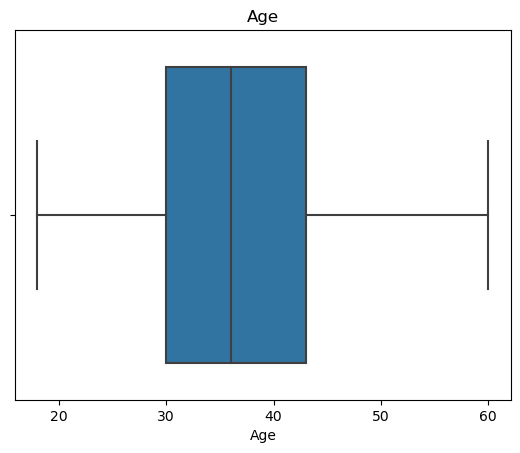

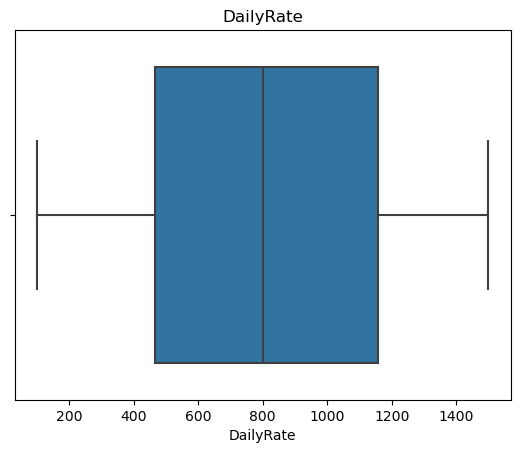

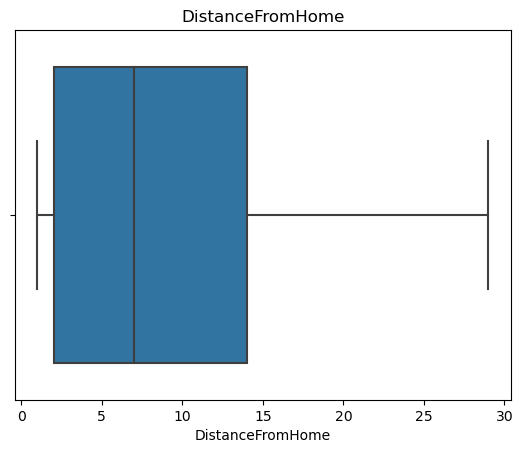

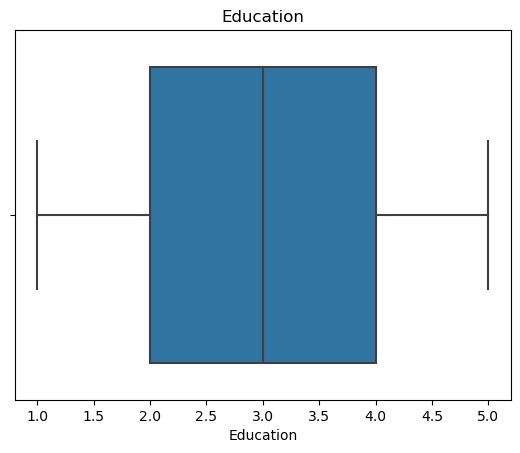

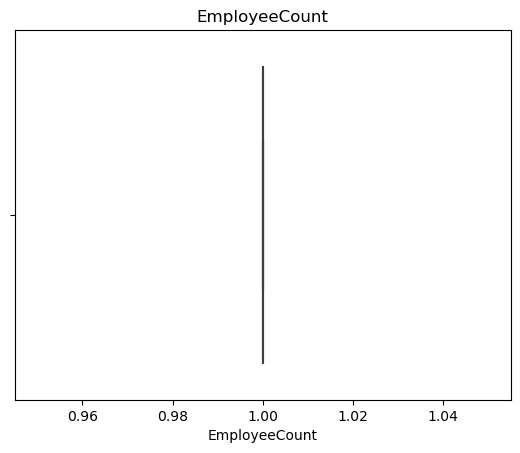

...

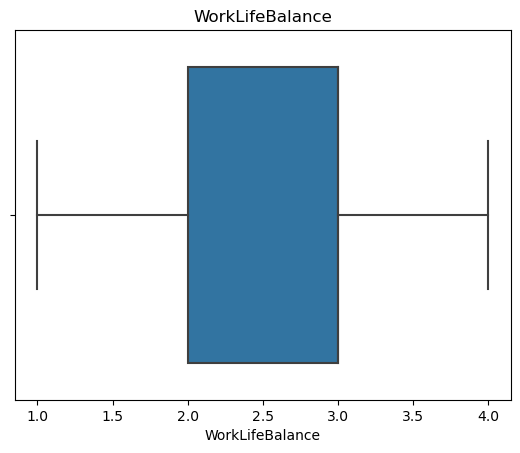

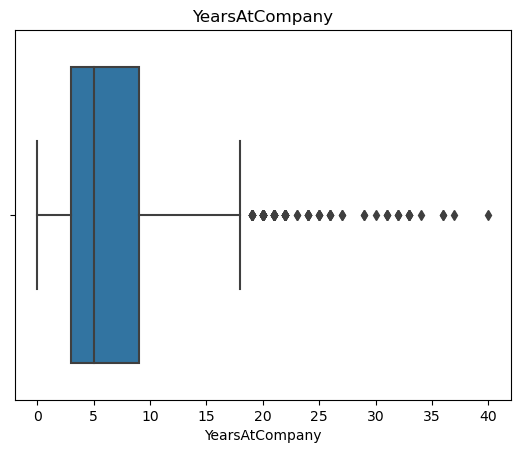

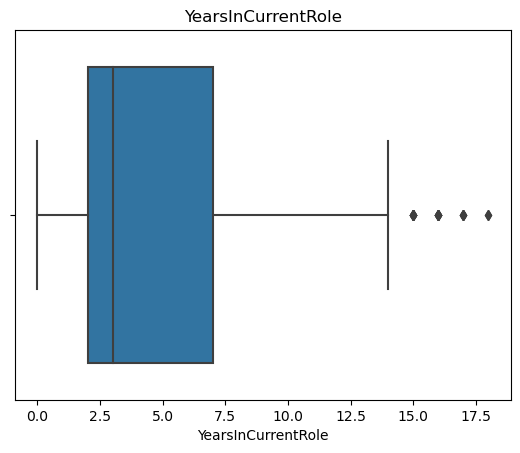

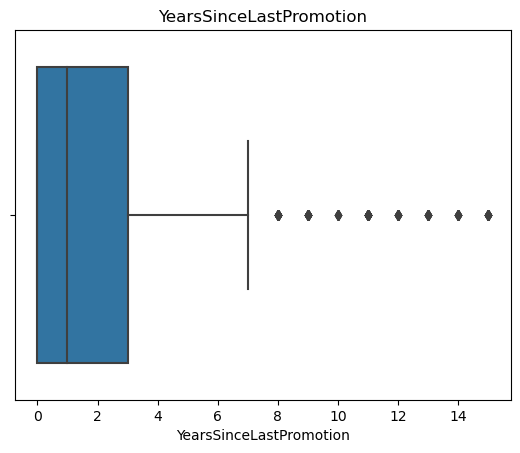

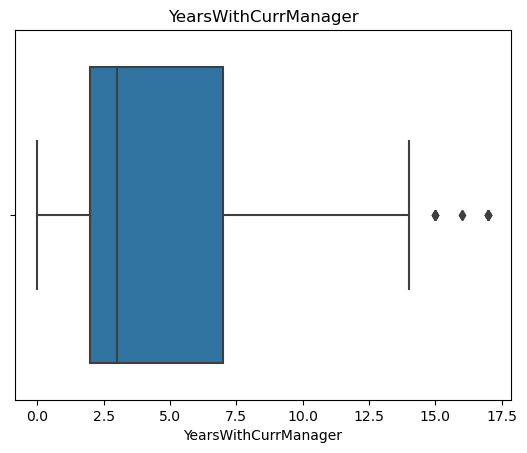

In [27]:
#check data distribution for numerical features
for i in df.select_dtypes(exclude='O'):
    sns.boxplot(x=df[i],data=df)
    plt.title(i)
    plt.show()

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
i)Data Distribution for Numerical Features with Attrition Distinction </b></span>

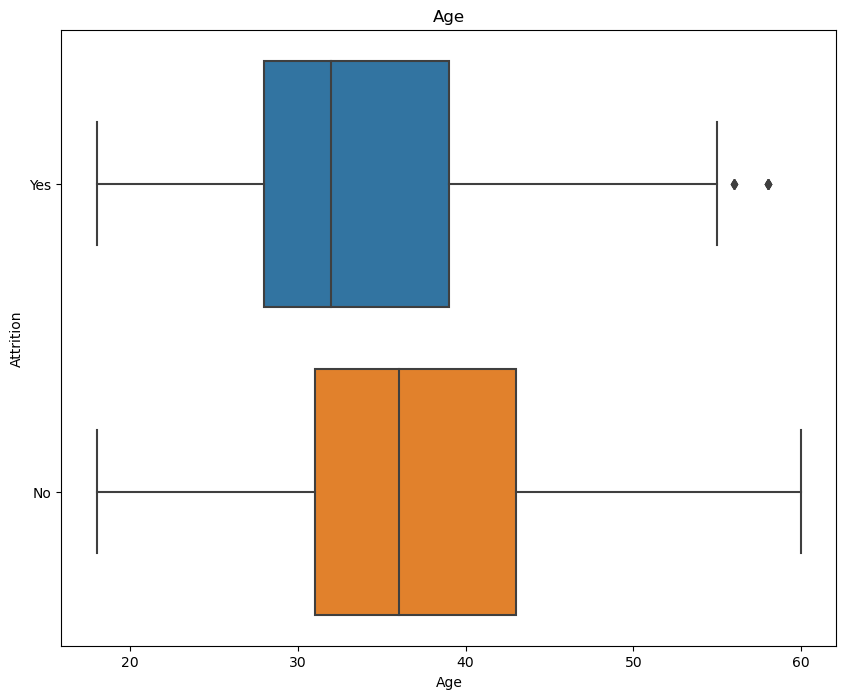

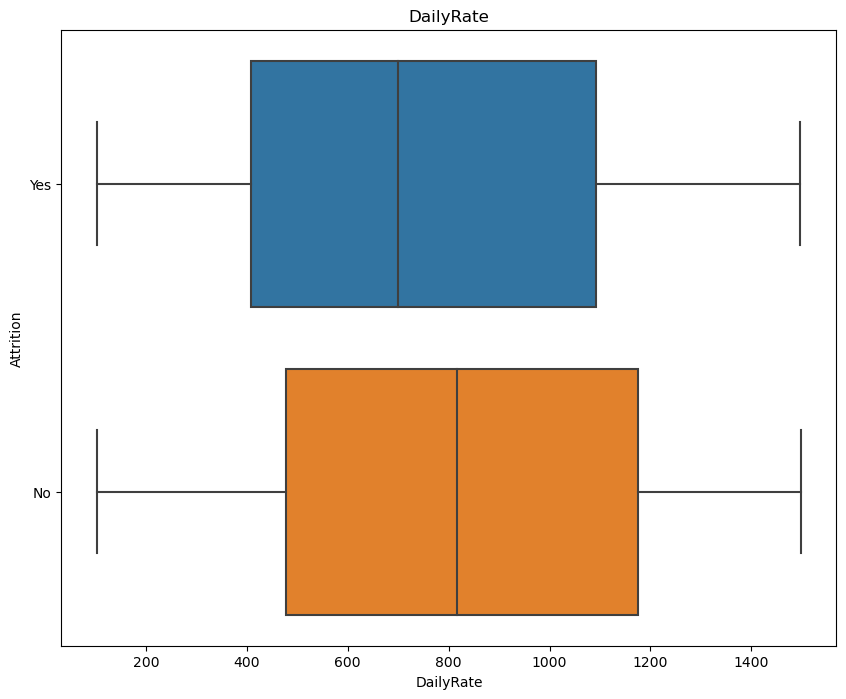

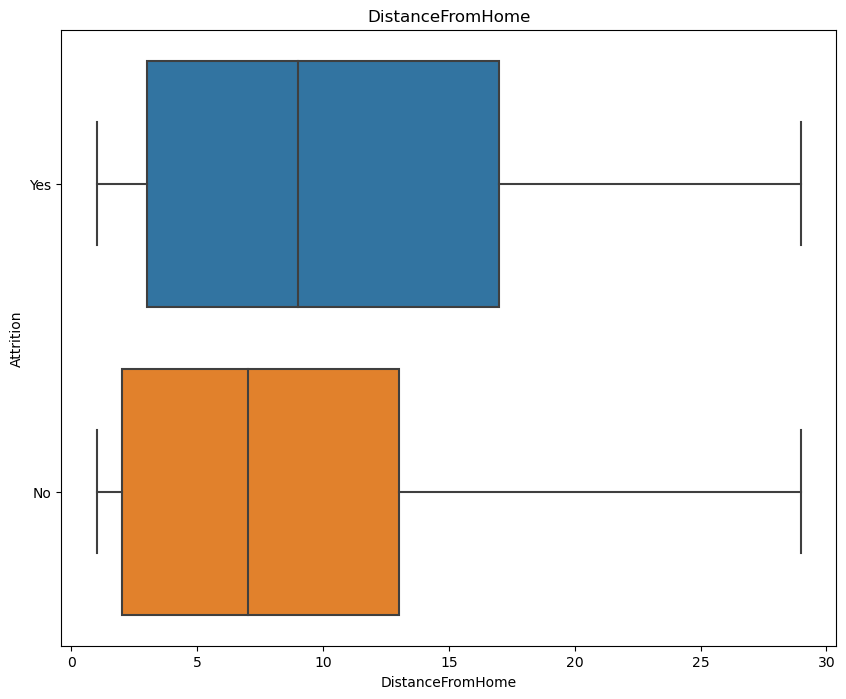

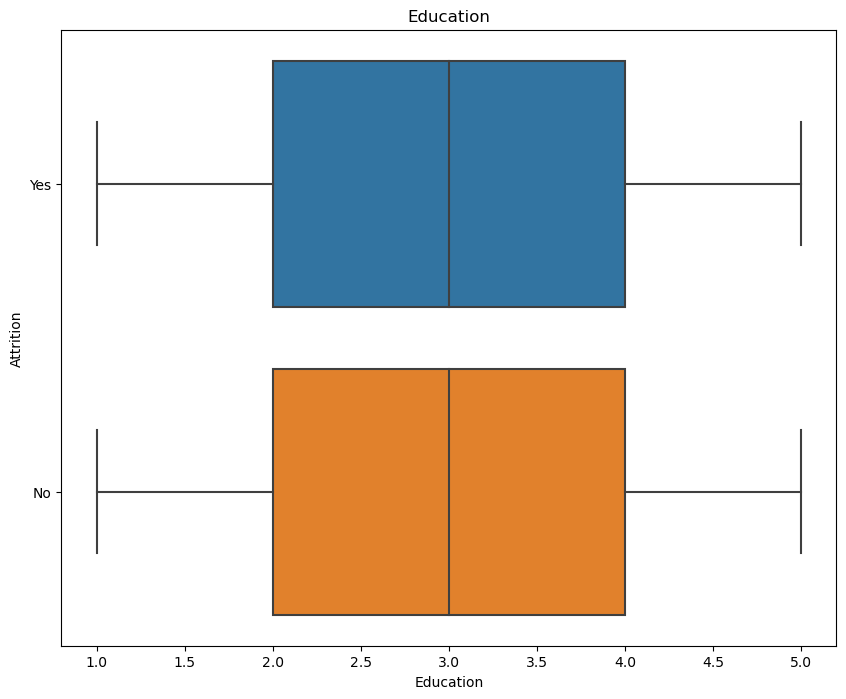

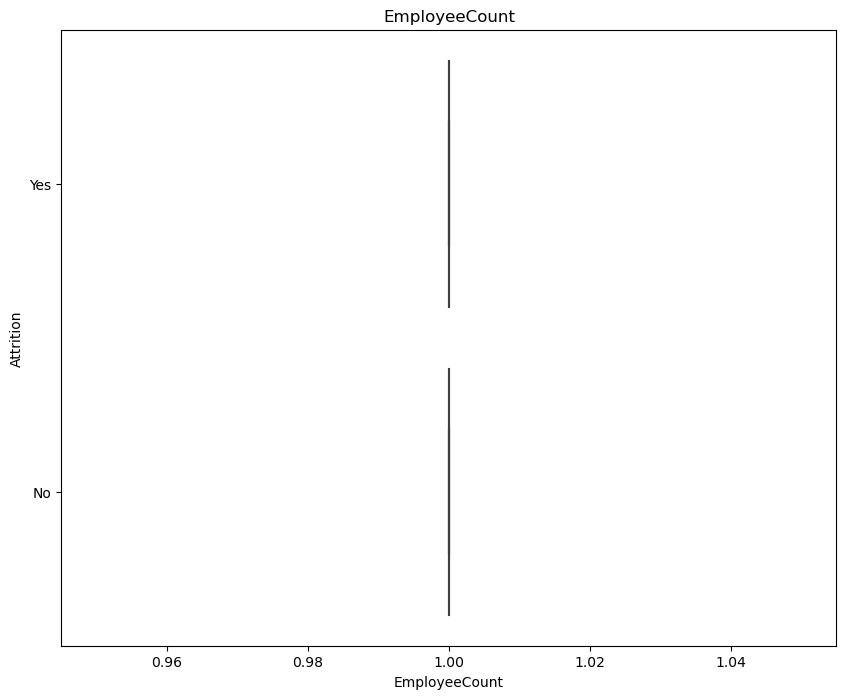

...

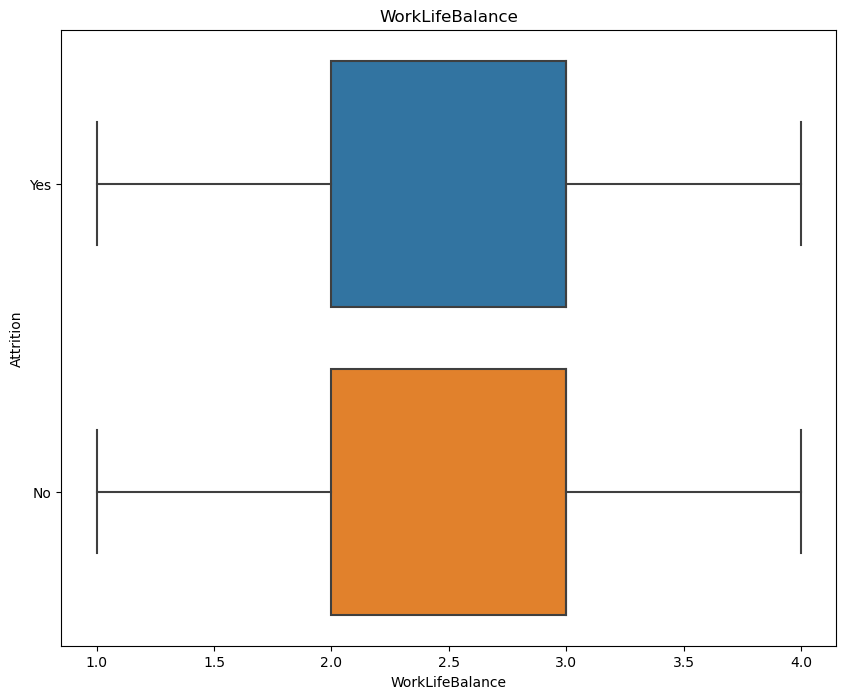

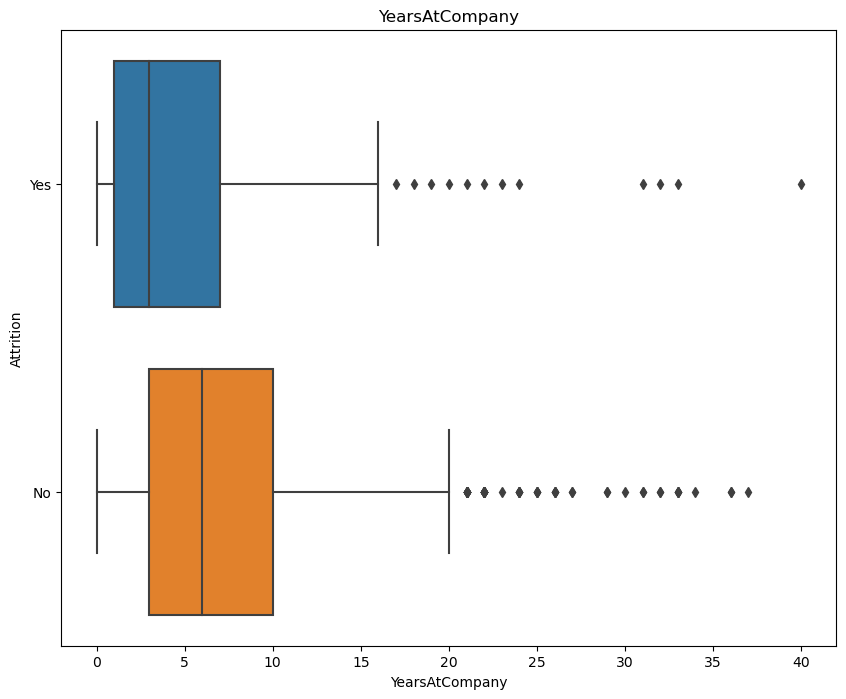

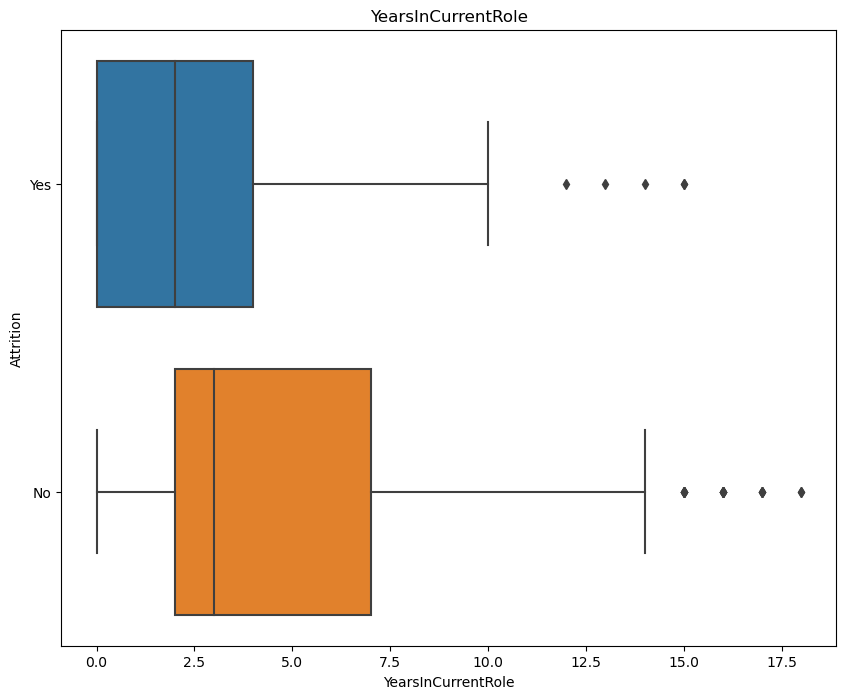

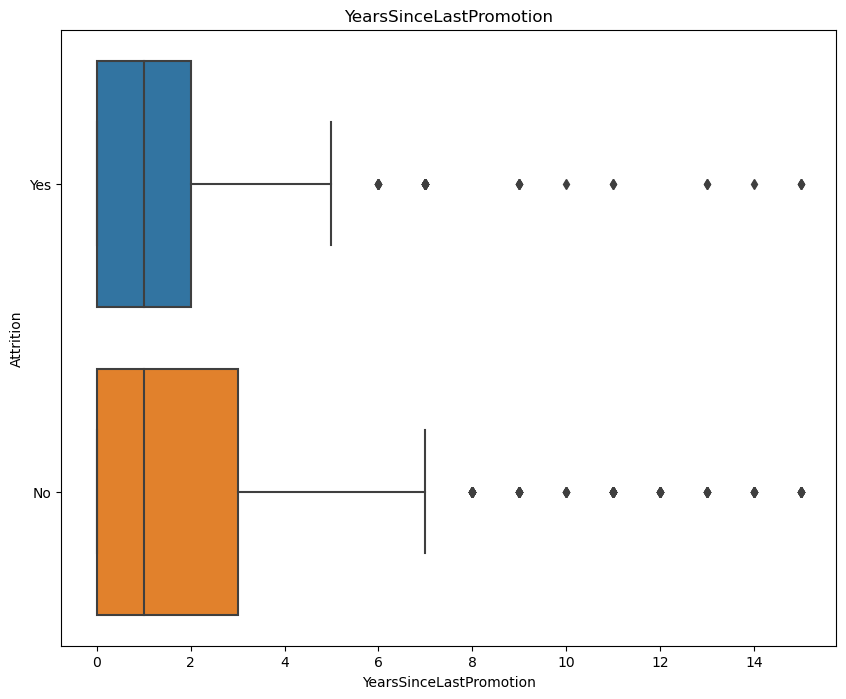

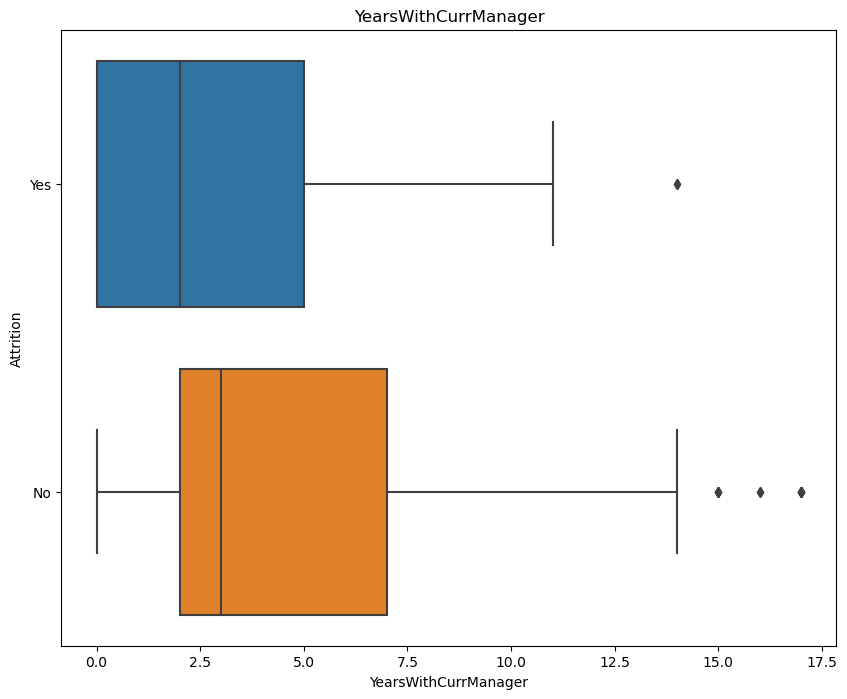

In [28]:
#check data distribution for numerical features with attrition distinction 

for i in df.select_dtypes(exclude='O'):
    plt.figure(figsize=(10,8))
    sns.boxplot(x=df[i],data=df,y='Attrition')
    plt.title(i)
    plt.show()



<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><b>4)</b> Relation <b> Between</b> Columns<b> ['DailyRate','MonthlyIncome','MonthlyRate','HourlyRate']</b></h2></div>

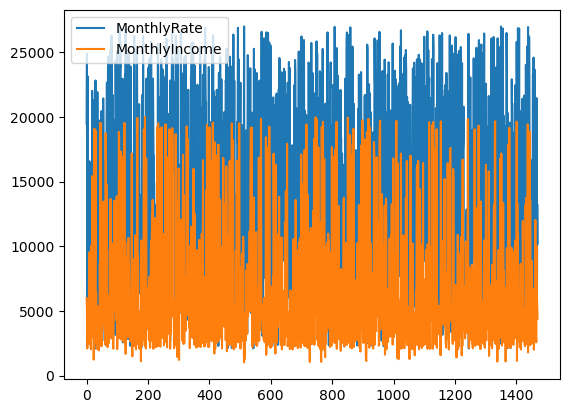

In [29]:
# check the relation between the three columns ['DailyRate','MonthlyIncome','MonthlyRate','HourlyRate']

plt.plot(df['MonthlyRate'])
plt.plot(df['MonthlyIncome'])
plt.legend(['MonthlyRate','MonthlyIncome'])
plt.show()

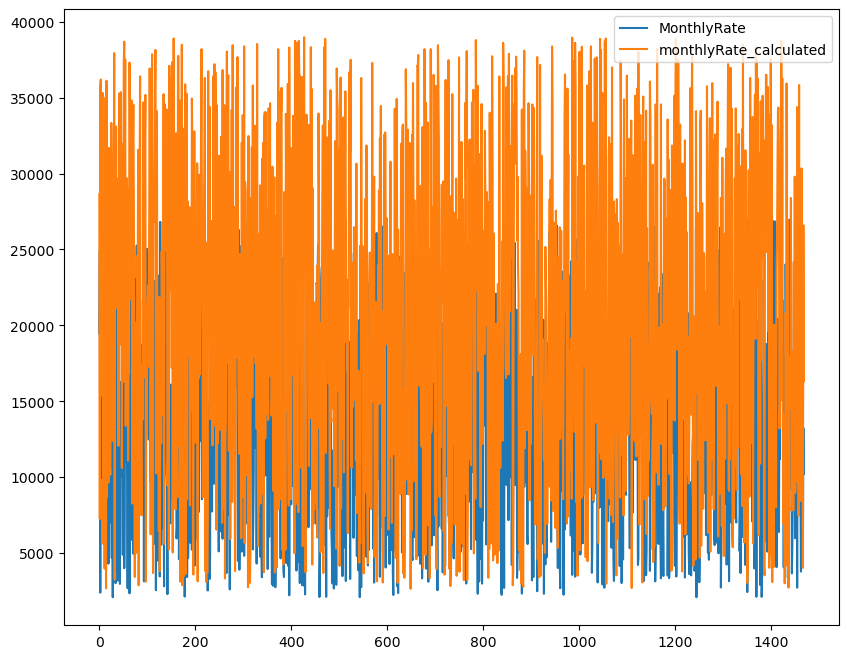

In [30]:
plt.figure(figsize=(10,8))
monthlyRate_calculated = df['DailyRate']* df['HourlyRate']*26 #26 days per mmonth
monthlyRate_calculated2 = df['DailyRate'] *26
plt.plot(df['MonthlyRate'])
plt.plot(monthlyRate_calculated2)
plt.legend(['MonthlyRate','monthlyRate_calculated'])
plt.show()


<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><b>5)</b> Plotting <b> Features</b> Against<b> Attrition</b> Count</h2></div>

In [31]:
#change the value of Attrition column to be {'Yes':1, 'No',0}
new_attrition_values = {'Yes':1, 'No':0}

df['Attrition'] = df['Attrition'].map(new_attrition_values)

<Figure size 1000x500 with 0 Axes>

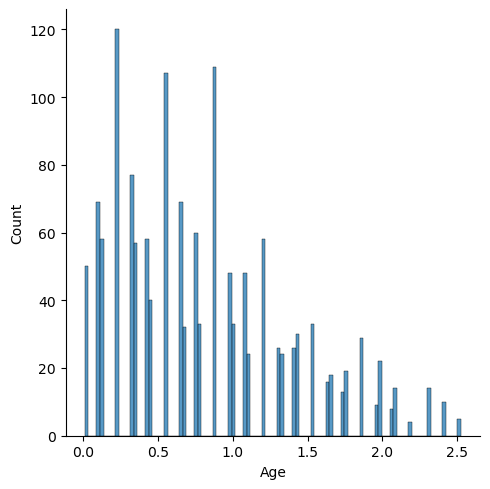

<Figure size 1000x500 with 0 Axes>

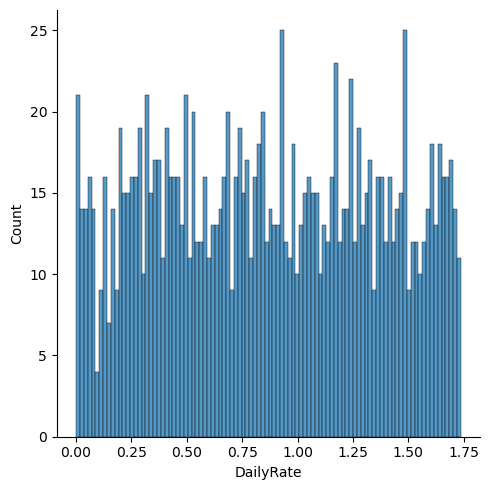

<Figure size 1000x500 with 0 Axes>

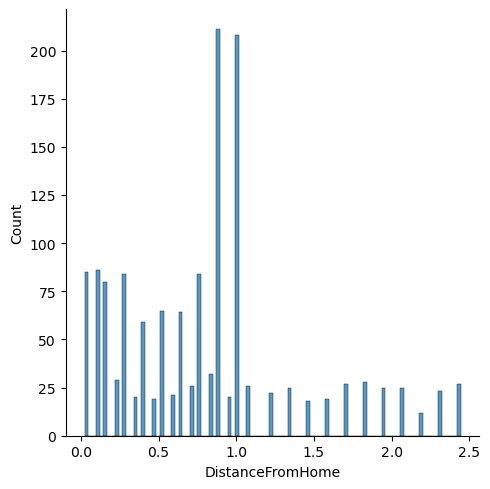

<Figure size 1000x500 with 0 Axes>

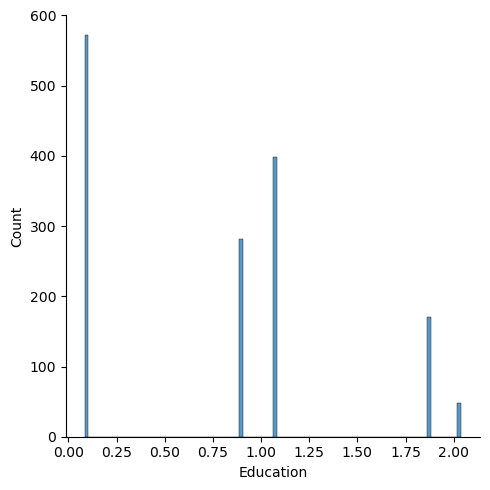

<Figure size 1000x500 with 0 Axes>

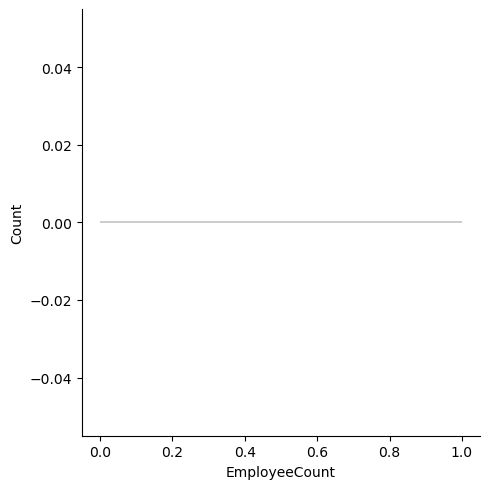

<Figure size 1000x500 with 0 Axes>

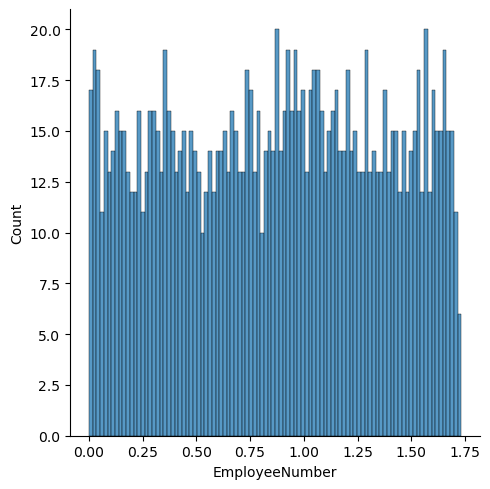

<Figure size 1000x500 with 0 Axes>

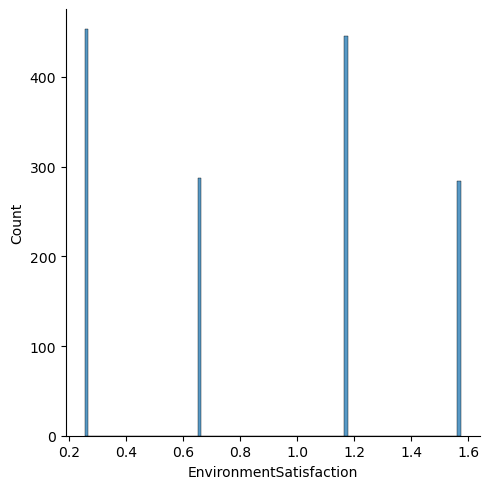

<Figure size 1000x500 with 0 Axes>

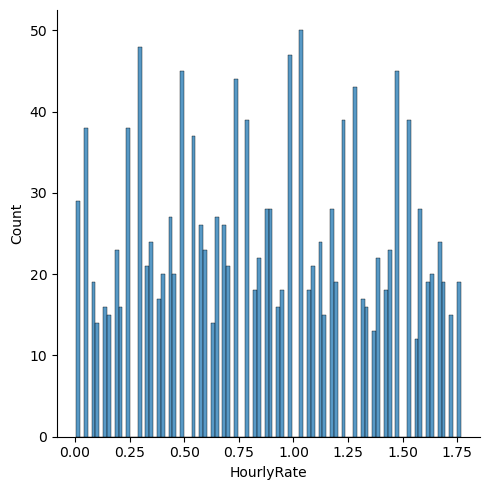

<Figure size 1000x500 with 0 Axes>

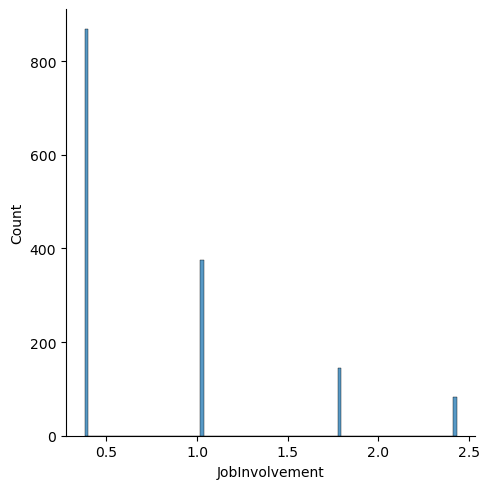

<Figure size 1000x500 with 0 Axes>

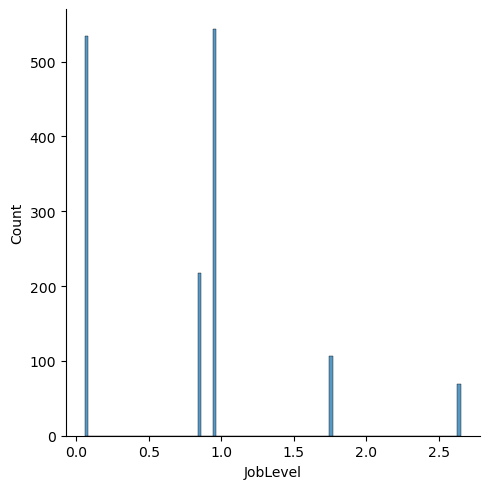

<Figure size 1000x500 with 0 Axes>

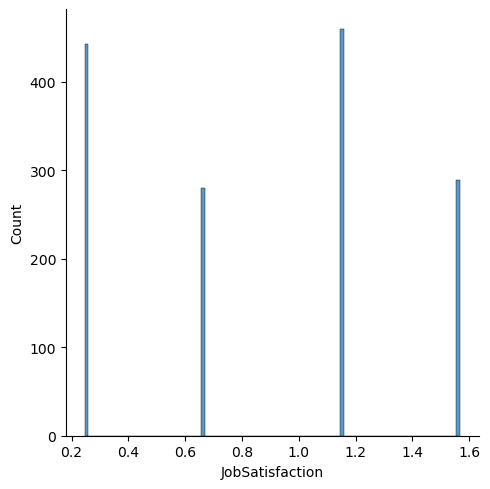

<Figure size 1000x500 with 0 Axes>

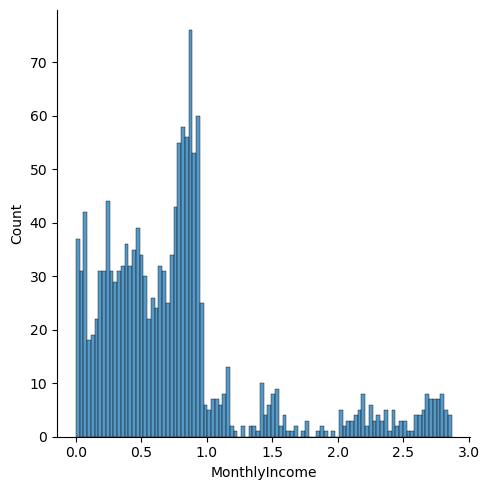

<Figure size 1000x500 with 0 Axes>

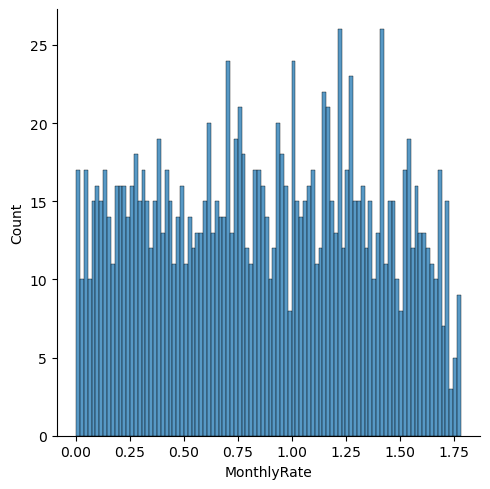

<Figure size 1000x500 with 0 Axes>

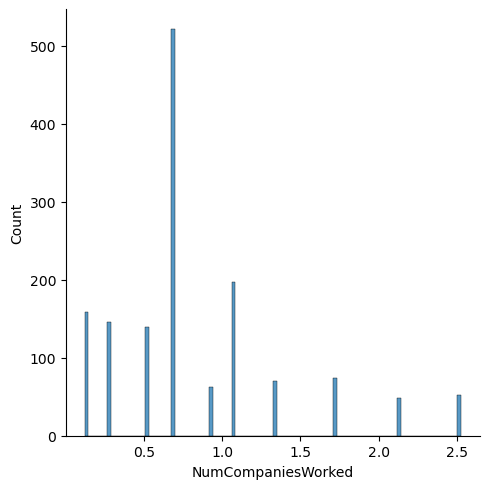

<Figure size 1000x500 with 0 Axes>

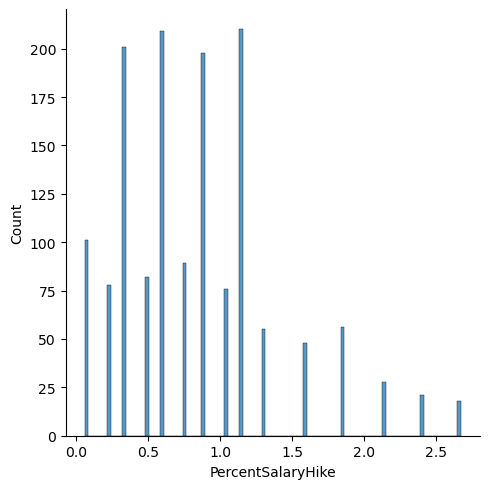

<Figure size 1000x500 with 0 Axes>

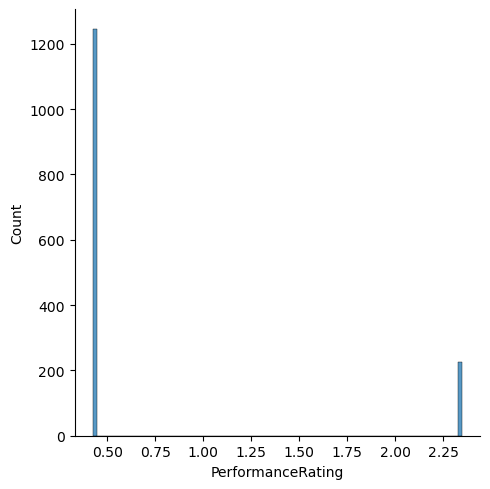

<Figure size 1000x500 with 0 Axes>

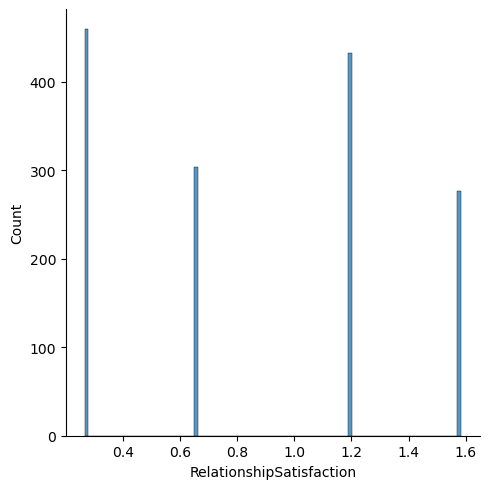

<Figure size 1000x500 with 0 Axes>

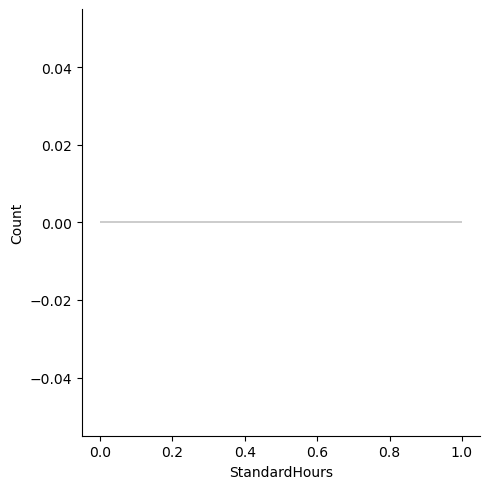

<Figure size 1000x500 with 0 Axes>

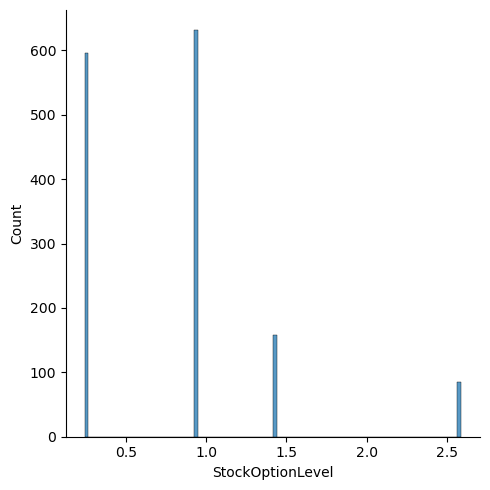

<Figure size 1000x500 with 0 Axes>

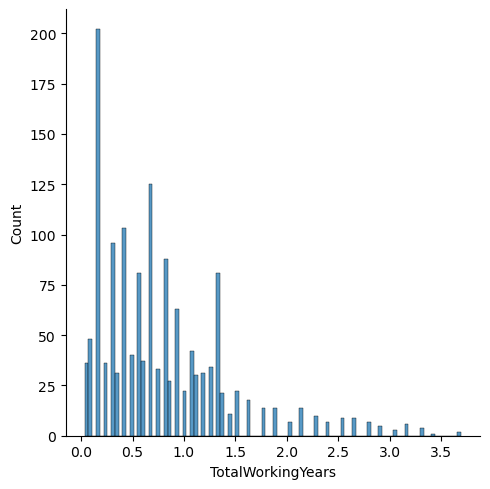

<Figure size 1000x500 with 0 Axes>

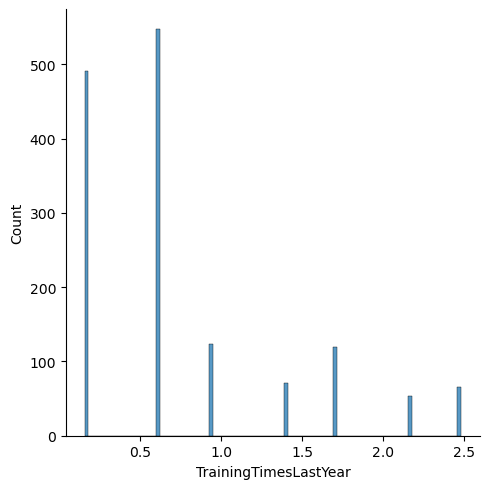

<Figure size 1000x500 with 0 Axes>

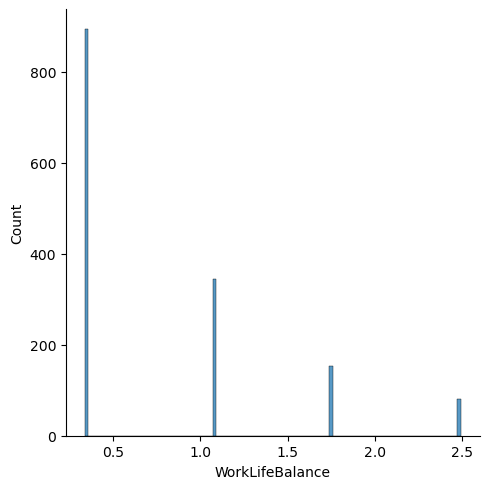

<Figure size 1000x500 with 0 Axes>

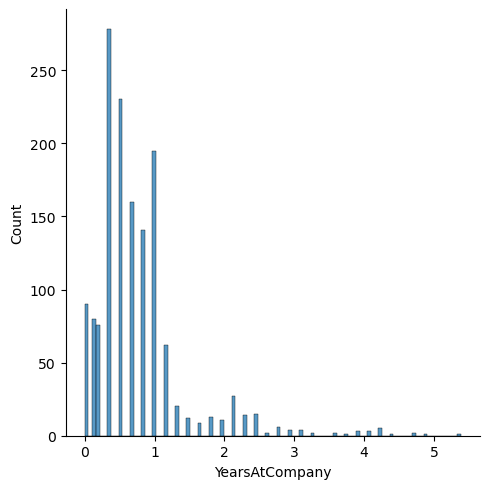

<Figure size 1000x500 with 0 Axes>

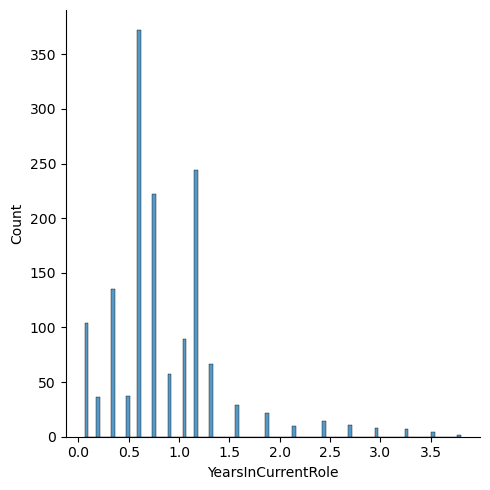

<Figure size 1000x500 with 0 Axes>

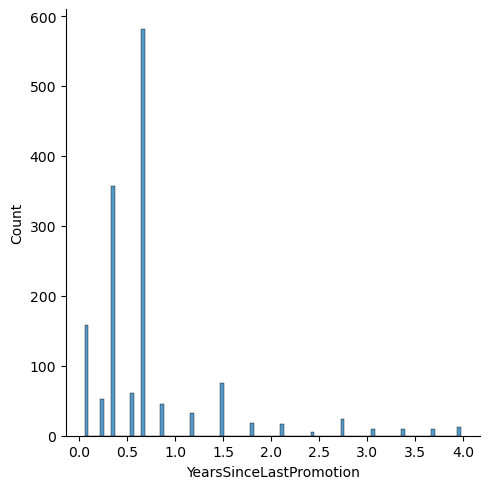

<Figure size 1000x500 with 0 Axes>

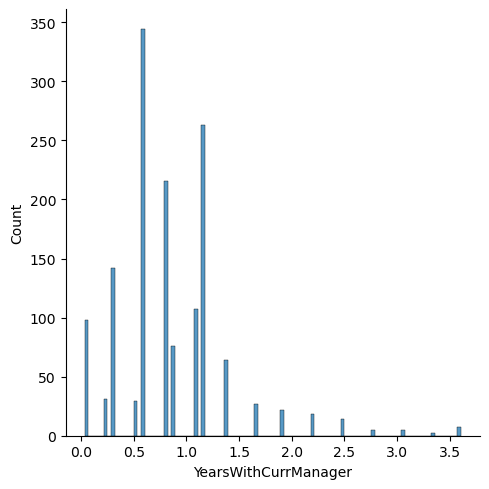

In [32]:
#px.figure(num = None, figsize = (8,10), dpi = 80, facecolor = 'w', edgecolor = 'w')
for cols in z_val_df:
    plt.figure(figsize = (10,5))
    sns.displot(z_val_df[cols],bins=100)

<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><b>6)</b> Correlation<b> Matrix</b> </h2></div>

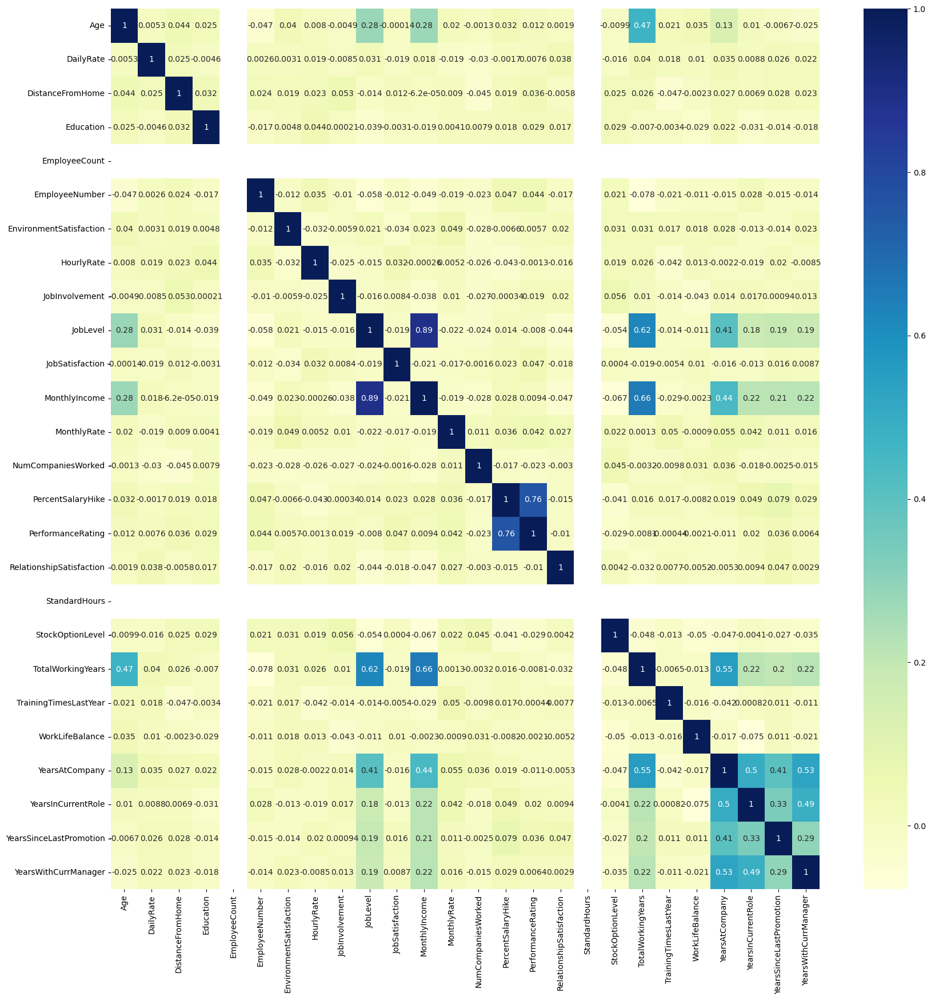

In [33]:
plt.figure(figsize=(20,20))
heatmap=sns.heatmap(z_val_df.corr(), annot=True, cmap="YlGnBu")
plt.savefig('heatmap.png', dpi=400)

#### Observations:
* ['StandardHours'] -> has only one unique value = 80 
=>> should be dropped, however i will keep it for any potential use later on
* the data show different between the hourly rate and daily rate with the monthly rate
* also, the monthly rate is not same as the monthly income 
- i will use "MontlyIncome" as reference for the income instead of the other 3 columns ['DailyRate','MonthlyIncome,'MonthlyRate','HourlyRate'' 

* "Over18", "EmployeeCount","StandardHours" will be dropped for now -> no variance 
* There is a higgh correlation between "MonthlyIncome" and "JobLeve". ->Therefore, dropping JobLevel.


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
i)Scatter Plot Between "JobLevel" and "MonthlyIncome" </b></span>

<Axes: xlabel='JobLevel', ylabel='MonthlyIncome'>

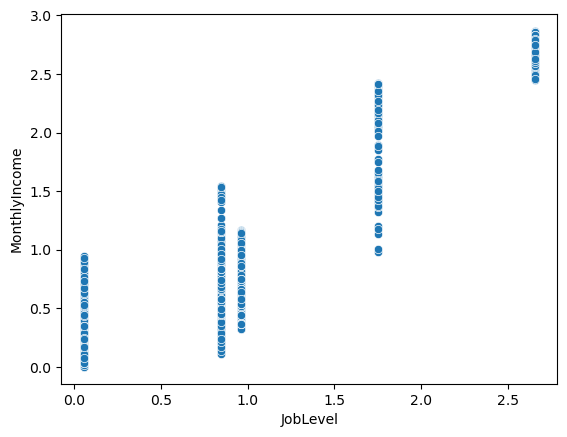

In [34]:
#Scatter Plot to verify Correlation Status
sns.scatterplot(x = z_val_df["JobLevel"], y = z_val_df["MonthlyIncome"])

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
ii)Scatters of Monthly IncomeVS Age with the Attrition "JobLevel" and "MonthlyIncome" </b></span>

In [35]:
#df.drop(columns=["Over18", "EmployeeCount","StandardHours"],inplace=True)

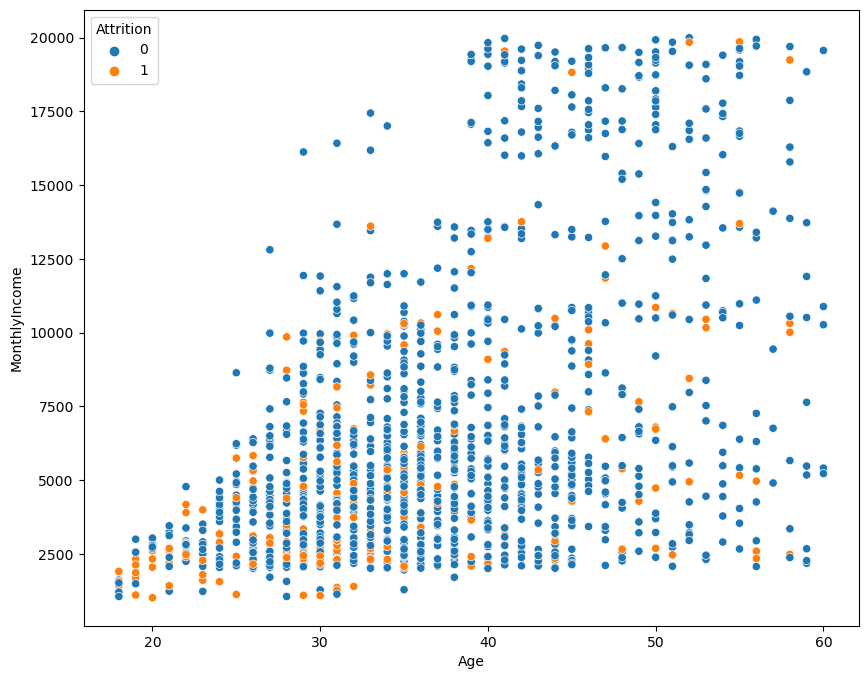

In [36]:
plt.figure(figsize=(10,8))
sns.scatterplot(x='Age',y='MonthlyIncome',data=df,hue='Attrition')
plt.show()

- Clearly that the more employee are paid  as monthly income, the lower probaility to move

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
ii)Explore the data with respect to Attrition feature </b></span>


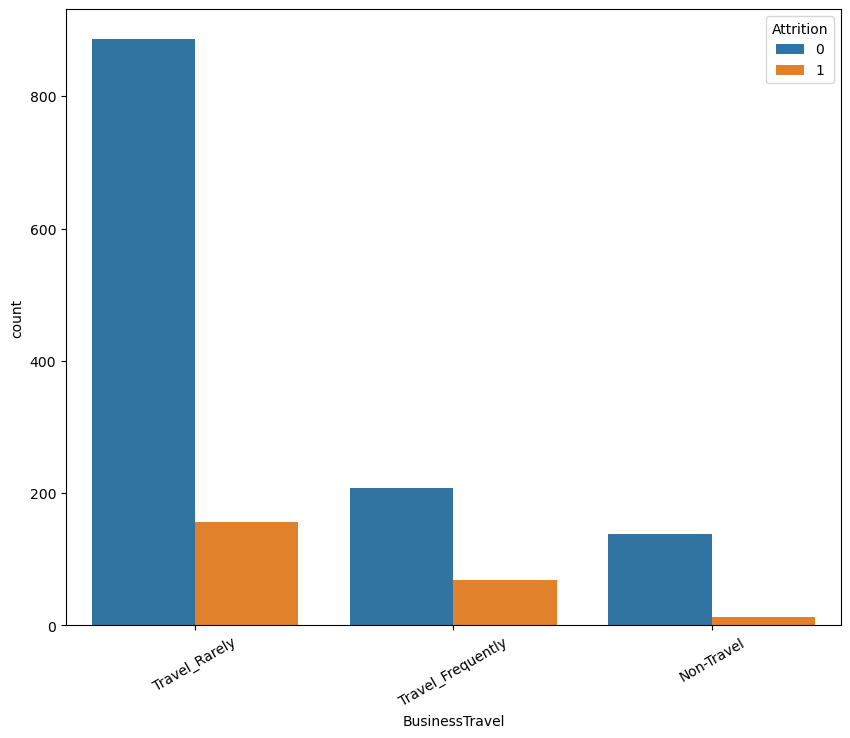

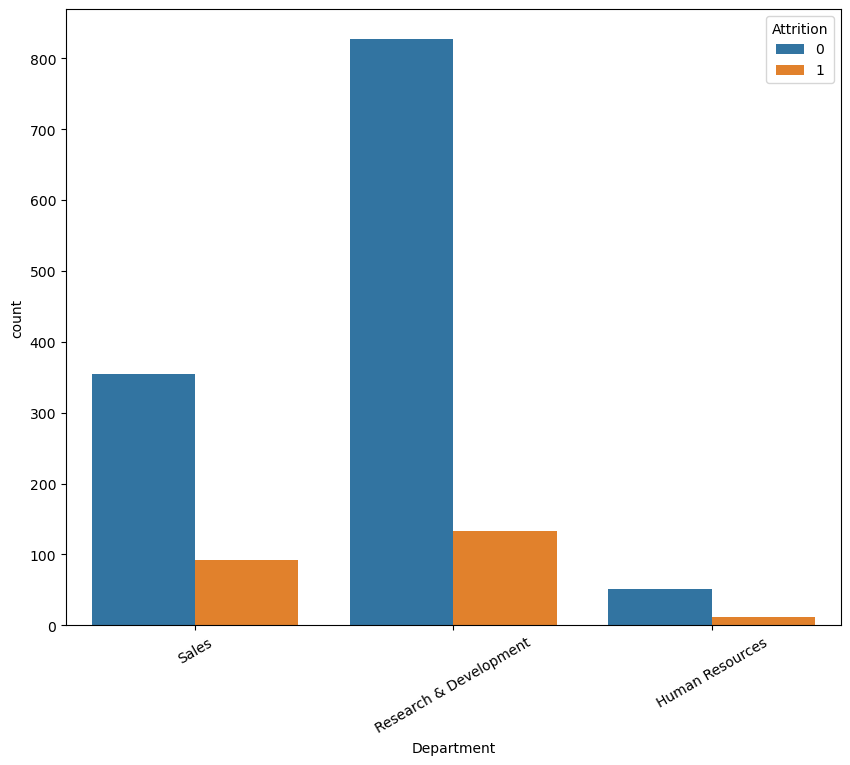

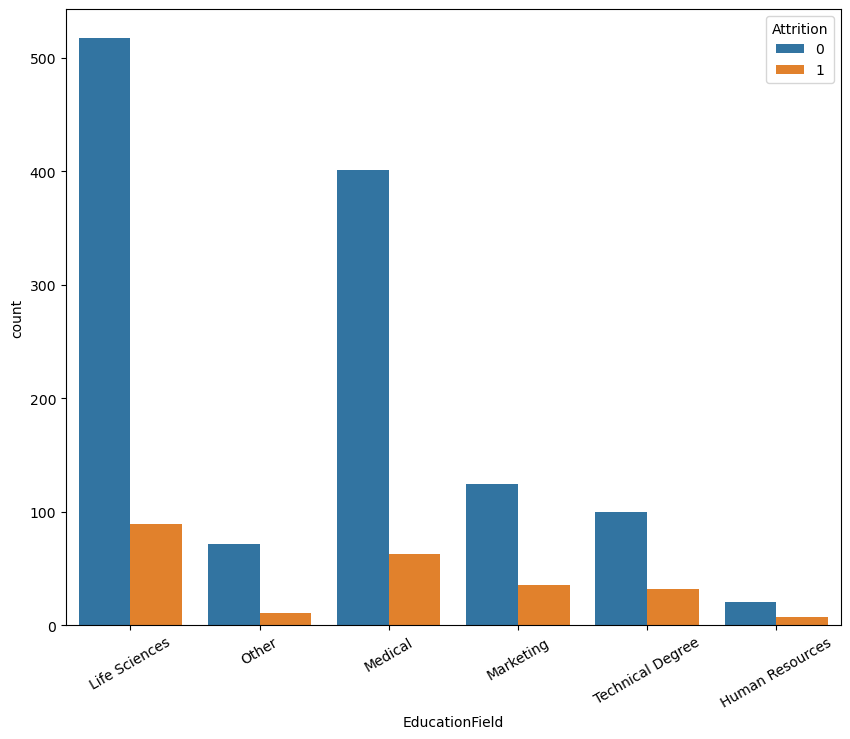

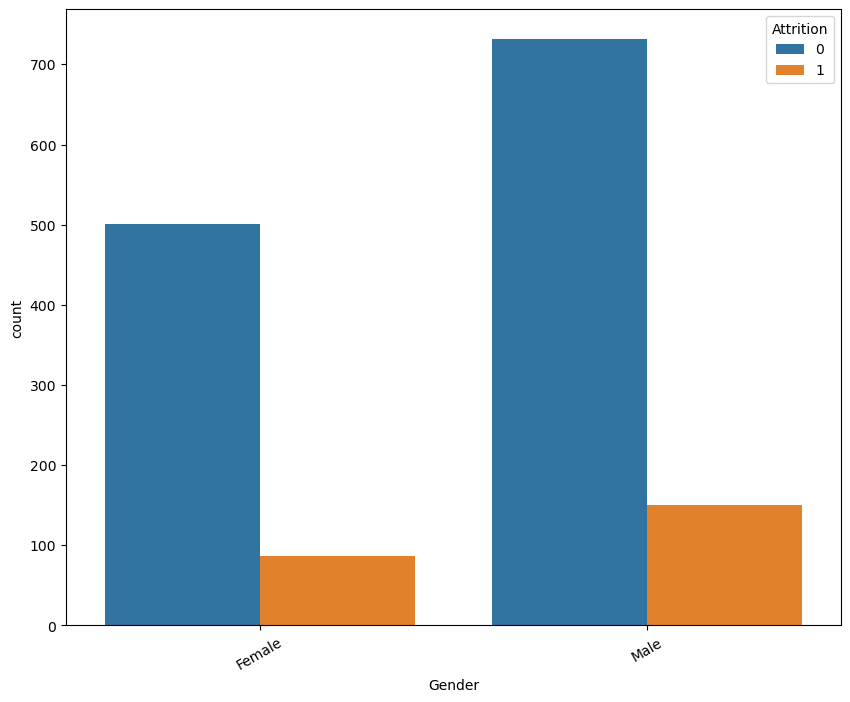

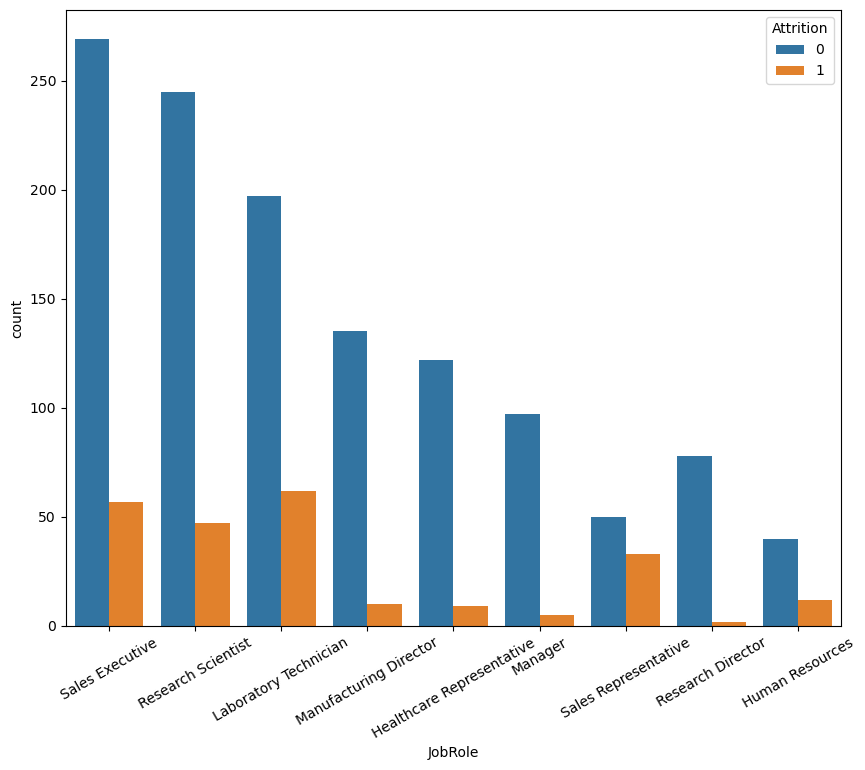

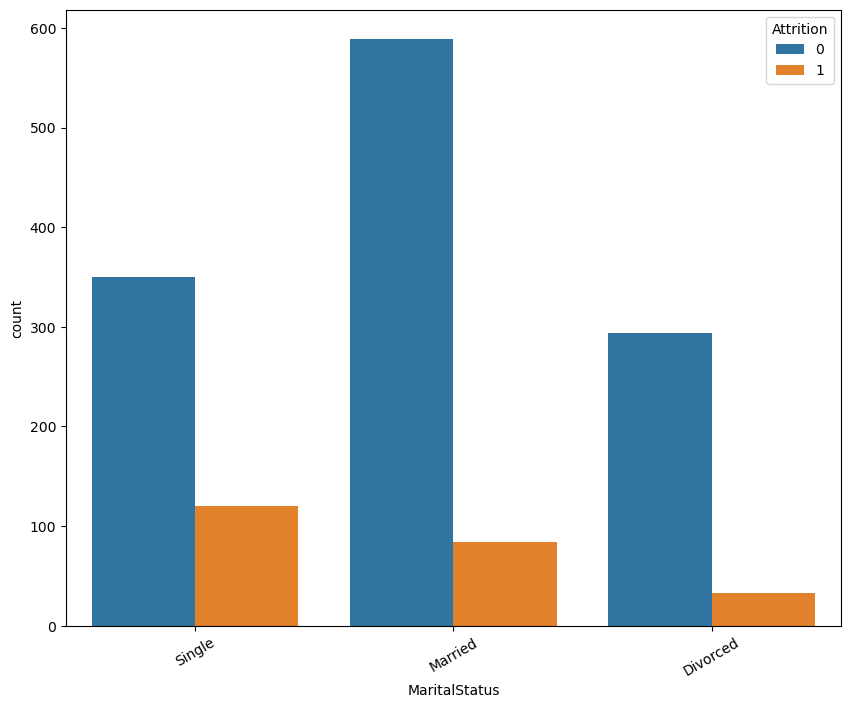

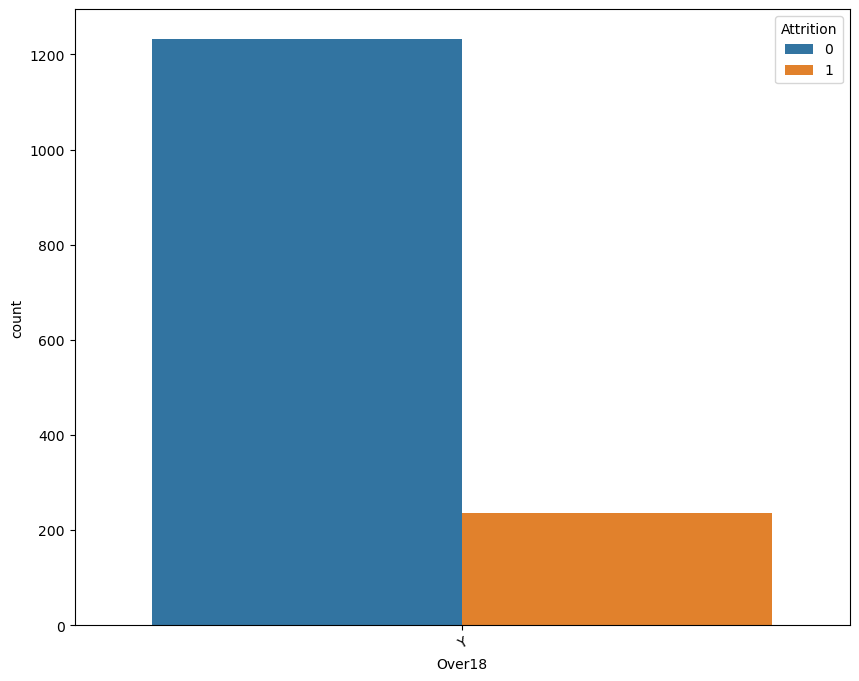

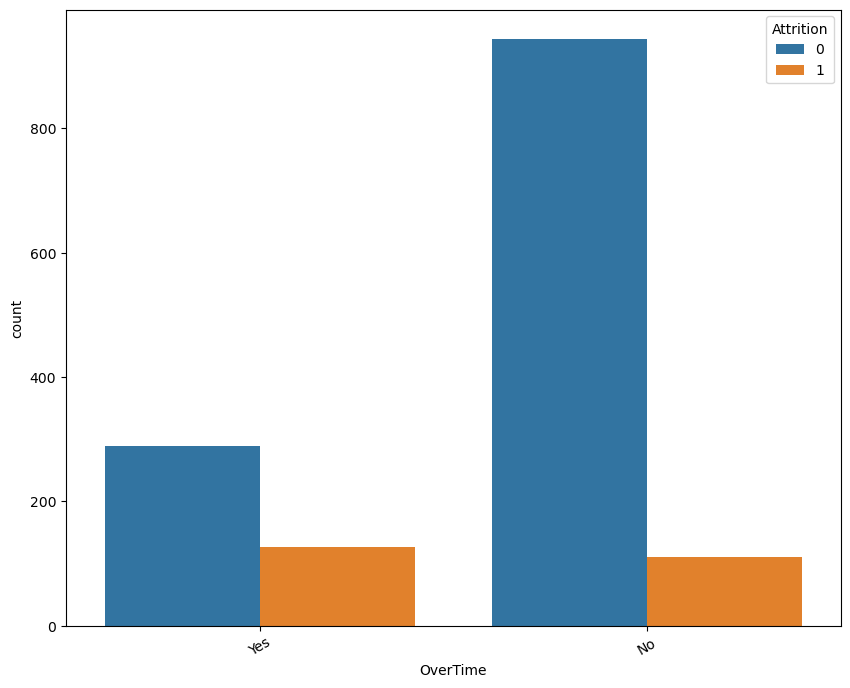

In [37]:
#explore the data with respect to Attrition feature
for i in df.select_dtypes(include="O"):
    plt.figure(figsize=(10,8))
    sns.countplot(x=df[i], data=df, hue="Attrition")
    plt.xticks(rotation=30)
    plt.show()


[//]: <> (1.Introduction)
<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><center><b>Data Preprocessing</b><center><h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;">Data Transformation<b> And </b> Feature Engineering  </h2></center></div>
    

In [38]:
dropped_cols = ['MonthlyRate','HourlyRate','EmployeeNumber','DailyRate']
cat_oneHot = ['Department','EducationField','JobRole']
cat_labelEncoder = ['BusinessTravel','Gender','MaritalStatus','OverTime']

#dropped cols that not needed in our analysis
df.drop(columns=dropped_cols, inplace=True)


In [39]:
#change the categorical data using one hot encoder 
cat_oneHot = ['Department','EducationField','JobRole']
encoded_df = pd.get_dummies(df, columns=cat_oneHot)


In [40]:
## change the categorical data to numerical values
cat_labelEncoder = ['BusinessTravel','Gender','MaritalStatus','OverTime']
labelEncoder = LabelEncoder()
for i in cat_labelEncoder:
    encoded_df[i] = labelEncoder.fit_transform(encoded_df[i])

In [41]:
#splitting Data to target and features
y = encoded_df['Attrition'].copy()
X = encoded_df.drop(columns='Attrition')

X

,Age,BusinessTravel,DistanceFromHome,Education,EmployeeCount,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobSatisfaction,MaritalStatus,MonthlyIncome,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Department_Human Resources,Department_Research & Development,Department_Sales,EducationField_Human Resources,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Healthcare Representative,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative
0,41,2,1,2,1,2,0,3,2,4,2,5993,8,Y,1,11,3,1,80,0,8,0,1,6,4,0,5,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False
1,49,1,8,1,1,3,1,2,2,2,1,5130,1,Y,0,23,4,4,80,1,10,3,3,10,7,1,7,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False
2,37,2,2,2,1,4,1,2,1,3,2,2090,6,Y,1,15,3,2,80,0,7,3,3,0,0,0,0,False,True,False,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False
3,33,1,3,4,1,4,0,3,1,3,1,2909,1,Y,1,11,3,3,80,0,8,3,3,8,7,3,0,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,True,False,False
4,27,2,2,1,1,1,1,3,1,2,1,3468,9,Y,0,12,3,4,80,1,6,3,3,2,2,2,2,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,1,23,2,1,3,1,4,2,4,1,2571,4,Y,0,17,3,3,80,1,17,3,3,5,2,0,3,False,True,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False
1466,39,2,6,1,1,4,1,2,3,1,1,9991,4,Y,0,15,3,1,80,1,9,5,3,7,7,1,7,False,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False
1467,27,2,4,3,1,2,1,4,2,2,1,6142,1,Y,1,20,4,2,80,1,6,0,3,6,2,0,3,False,True,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False
1468,49,1,2,3,1,4,1,2,2,2,1,5390,2,Y,0,14,3,4,80,0,17,3,2,9,6,0,8,False,False,True,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False


In [42]:
#applying standard scaler to the data
'''
stnd = StandardScaler()
X_stnd = stnd.fit_transform(X)
X_stnd_df = pd.DataFrame(data=X_stnd,columns=X.columns,)
X_stnd_df
'''

'\nstnd = StandardScaler()\nX_stnd = stnd.fit_transform(X)\nX_stnd_df = pd.DataFrame(data=X_stnd,columns=X.columns,)\nX_stnd_df\n'

In [43]:
 #remove outliers values for some columns by using z_scores 
'''
outliers_cols = ['YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager','YearsAtCompany','MonthlyIncome']
for i in outliers_cols:
    X_stnd_df = X_stnd_df[(np.abs(stats.zscore(X_stnd_df[i])) < 3)]
'''

"\noutliers_cols = ['YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager','YearsAtCompany','MonthlyIncome']\nfor i in outliers_cols:\n   X_stnd_df = X_stnd_df[(np.abs(stats.zscore(X_stnd_df[i])) < 3)]\n"

In [44]:
#check data distribution for numerical features after standarization
'''
for i in X_stnd_df.select_dtypes(exclude='O'):
    sns.boxplot(x=X_stnd_df[i],data=X_stnd_df)
    plt.title(i)
    plt.show()

'''

"\nfor i in X_stnd_df.select_dtypes(exclude='O'):\n    sns.boxplot(x=X_stnd_df[i],data=X_stnd_df)\n    plt.title(i)\n    plt.show()\n\n"



[//]: <> (1.Introduction)
<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><center><b>Re-Usable Feature Engineering Pipeline</b><center><h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;">Creating a <b>Pipeline</b> function that contains each data processing stage through the entire script </h2></center></div>

In [46]:
### pipeline function
def pipeline(df):
    
    #take a copy from the dataframe
    df = pd.read_csv('data\WA_Fn-UseC_-HR-Employee-Attrition.csv')
    df_in = df.copy()
    
    #change the value of Attrition column to be {'Yes':1, 'No',0}
    new_attrition_values = {'Yes':1, 'No':0}
    df_in['Attrition'] = df_in['Attrition'].map(new_attrition_values)
    
    #deleting elements that have no variance or no need 
    dropped_cols = ["Over18", "EmployeeCount","StandardHours",
                    'MonthlyRate','HourlyRate','EmployeeNumber',
                    'DailyRate']
    df_in = df_in.drop(columns=dropped_cols)
    
    #assign outliers value for some columns by using z_scores 

    outliers_cols = df_in.select_dtypes(exclude='O').columns
    for i in outliers_cols:
        df_in = df_in[(np.abs(stats.zscore(df_in[i])) < 3)]
    
    
    #features need to be transformed using one hot encoder
    cat_oneHot = ['Department','EducationField','JobRole','BusinessTravel','Gender',
                  'MaritalStatus','OverTime']
    #change the categorical data using one hot encoder 
    encoded_df_in = pd.get_dummies(df_in, columns=cat_oneHot)
    
        
    #splitting Data to target and features
    y = encoded_df_in['Attrition'].copy()
    X = encoded_df_in.drop(columns='Attrition')
    
    #applying standard scaler to the data
    stnd = StandardScaler()
    X_stnd = stnd.fit_transform(X)
    X_stnd_df = pd.DataFrame(data=X_stnd,columns=X.columns)
    

    #splitting data for train and test to start training the ml model
    X_train,  X_test, y_train, y_test = train_test_split(X_stnd_df,y,test_size=0.3, random_state=22)
    
    
    return X_train, X_test, y_train,  y_test

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
i)Splitting Data to Training and Testing Data</b></span>

In [47]:
X_train, X_test, y_train, y_test = pipeline(data)

#check the shape
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(954, 48)
(954,)
(409, 48)
(409,)


[//]: <> (1.Introduction)
<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><center><b>Training ML Models<i>(Before Data Augmentation)</i></b><center><h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><center>[Logistic Regression / Random Forest / SVM / DecisionTree] </h2></center></div>

<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><b>To</b> Show<b> Confusion </b> Matrix<b></b></h2></div>

In [48]:
## showing confusion matrix
def confusion_mat(model_name,y_train, y_pred):
    
    ##using confusion matrix 
    cm = confusion_matrix(y_train, y_pred)

    display = ConfusionMatrixDisplay(cm)
    display.plot(cmap=plt.cm.Blues)

    print(f"Confusion matrix of: {model_name}")
    print(f"Precision score: {precision_score(y_train, y_pred)*100}")
    print(f"Recall score: {recall_score(y_train, y_pred)*100}")
    print(f"F1 score: {f1_score(y_train, y_pred)*100}")

<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><b>Get</b> Best<b> Parameters</b> With<b> "Grid Search Aproach"</b></b></h2></div>

In [49]:
# get best params using grid search approach
def get_best_params(model,params, X_train, y_train):
    # Perform grid search with recall scoring
    grid_search = GridSearchCV(model, params, cv=5, scoring='recall')
    grid_search.fit(X_train, y_train)
    
    # Get the best hyperparameter values
    best_params = grid_search.best_params_
    print("Best Hyperparameters:", best_params)
    recall =  grid_search.best_score_ *100
    print("Best Recall score:",recall)
    
    return recall, best_params

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
1)Logistic Regression</b></span>

In [50]:
#defining the model
logit = LogisticRegression(solver='liblinear')

logit.fit(X_train, y_train)

LogisticRegression(solver='liblinear')

<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><b>Get</b> Best<b> Parameters</b> With<b> "Grid Search Aproach"</b></b></h2></div>

In [51]:
def get_best_params(model,params, X_train, y_train):
    # Perform grid search with recall scoring
    grid_search = GridSearchCV(model, params, cv=5, scoring='recall')
    grid_search.fit(X_train, y_train)
    
    # Get the best hyperparameter values
    best_params = grid_search.best_params_
    print("Best Hyperparameters:", best_params)
    recall =  grid_search.best_score_
    print("Best Recall score:",recall)
    
    return recall, best_params

In [52]:
#defining the parametrs of logitic regression for grid search
logit_param_grid = {
    'C': [0.1, 1.0, 10.0],
    'penalty': ['l1', 'l2'],

}

#getting the recall and best params for the logistic regression
logit_recall, logit_best_params = get_best_params(logit,logit_param_grid, X_train, y_train)


Best Hyperparameters: {'C': 10.0, 'penalty': 'l1'}
Best Recall score: 0.4647177419354839


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Predict with  5=>k folds Cross validation</b></span>

In [53]:
#create new model with the best parameters
logit_updated = LogisticRegression(solver='liblinear',**logit_best_params )

#with cross_val_predict (5=> k folds)
logit_train_data_pred = cross_val_predict(logit_updated, X_train, y_train, cv=5)



> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Evaluate Model Using Confusion Matrix</b></span>

Confusion matrix of: Logistic Regression
Precision score: 63.24786324786324
Recall score: 46.540880503144656
F1 score: 53.62318840579711


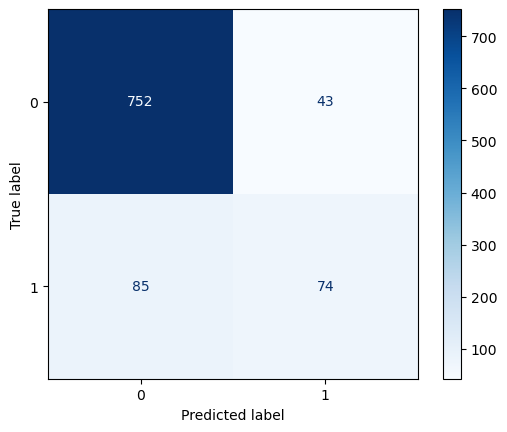

In [54]:
# using confusion matrix to evaluate the model
confusion_mat('Logistic Regression',y_train,logit_train_data_pred)

<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><b>Function</b> To<b> Calculate</b> Accuracy<b> From</b> Confusion <b>Matrix</b> Using <b>"True Positives"</b></h2></div>

In [55]:
## function that Calculates the accuracy from a confusion matrix.
def calculate_accuracy(matrix):  #takes a 2D NumPy array representing the confusion matrix as Args

  # Extract true positives (diagonal elements)
  true_positives = np.diag(matrix)

  # Calculate total number of predictions
  total_predictions = np.sum(matrix)

  # Calculate and return overall accuracy as a float.
  return np.sum(true_positives) / total_predictions


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Calculate Logistic Regression Accuracy</b></span>

In [56]:
confusion_matrix_logit = np.array([[752, 43], [85, 74]])
lr_acc_score= calculate_accuracy(confusion_matrix_logit)

print(f"The Accuracy of Logistic Regression is: {lr_acc_score:.4f}")

The Accuracy of Logistic Regression is: 0.8658


### Important Notes
- The precision score indicates that when the model predicts an employee to leave, it is correct around 69.69% of the time. 
- The recall score suggests that the model captures only 43.94% of employees who actually leave
- For this project's context, it's better to get higher "RECALL" to capture more true Values 
- The accuracy for Logistic Regression is 86.58

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Logistic Regression AUC</b></span>

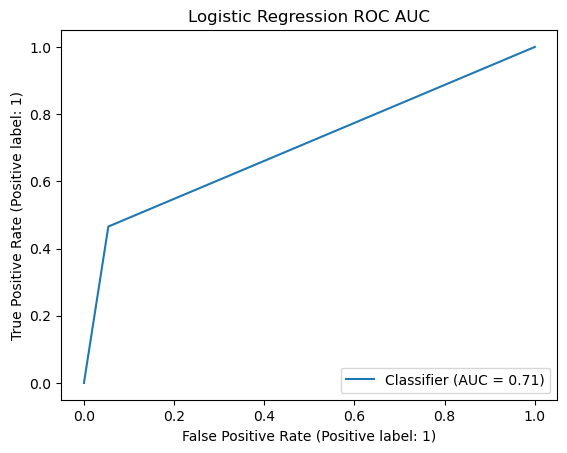


The area under curve for Logistic Regression is: 0.71


In [57]:
# check the ROC curve as well
RocCurveDisplay.from_predictions(y_train, logit_train_data_pred)
plt.title("Logistic Regression ROC AUC")
plt.show()

lr_auc = round(roc_auc_score(y_train, logit_train_data_pred),2)
print(f"\nThe area under curve for Logistic Regression is:",lr_auc)

#### It's clearly now that the logistic regression modle is not accurate, as we saw: the precision, recall and f1 score are so low, as well as the area under curve that shown the ratio between "True positive rate" to "False Positive rate" 

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
2)Random Forest Classifier</b></span>

In [58]:
#defining the model
forest = RandomForestClassifier(random_state=40)

forest_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5]
}

# Perform grid search with recall scoring
forest_recall, forest_best_params = get_best_params(forest,forest_param_grid, X_train, y_train)


Best Hyperparameters: {'max_depth': 5, 'n_estimators': 100}
Best Recall score: 0.16330645161290322


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Predict with  5=>k folds Cross validation</b></span>

In [59]:
forest_updated = RandomForestClassifier(random_state=40,**forest_best_params)

#with cross_val_predict (5 k folds)
forest_train_data_pred = cross_val_predict(forest_updated, X_train, y_train, cv=5)


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Evaluate Model Using Confusion Matrix</b></span>

Confusion matrix of: Random Forest Classifier
Precision score: 89.65517241379311
Recall score: 16.352201257861633
F1 score: 27.659574468085108


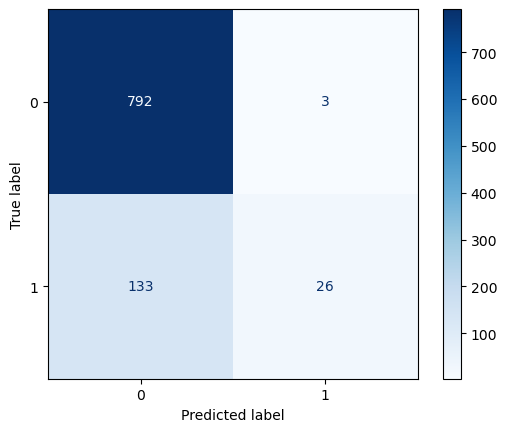

In [60]:
##using confusion matrix 
confusion_mat('Random Forest Classifier',y_train,forest_train_data_pred)

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Calculate Random Forest Classifier Accuracy</b></span>

In [61]:
confusion_matrix_forest = np.array([[792, 3], [133, 26]])
rfc_acc_score = calculate_accuracy(confusion_matrix_forest)

print(f"Accuracy of Random Forest Classifier: {rfc_acc_score:.4f}")

Accuracy of Random Forest Classifier: 0.8574


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Random Forest Classifier AUC</b></span>

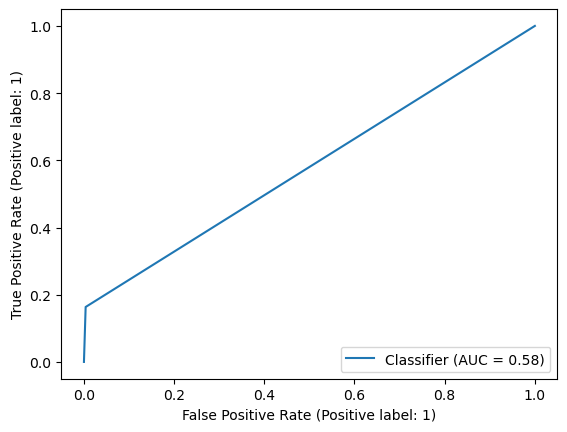


The area under curve for Random Forest Classifier is: 0.58


In [62]:
# check the ROC curve as well
RocCurveDisplay.from_predictions(y_train, forest_train_data_pred)
plt.show()
rfc_auc = round(roc_auc_score(y_train, forest_train_data_pred),2)
print(f"\nThe area under curve for Random Forest Classifier is:",rfc_auc)

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
3)Decision Tree  Classifier</b></span>

In [63]:
# Create the Decision Tree classifier
tree = DecisionTreeClassifier(random_state=40)

# Define the parameter grid for grid search
tree_param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Perform grid search with recall scoring
tree_recall, tree_best_params = get_best_params(tree,tree_param_grid, X_train, y_train)

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best Recall score: 0.4715725806451613


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Predict with  5=>k folds Cross validation</b></span>

In [64]:
tree_updated = DecisionTreeClassifier(random_state=40,**tree_best_params)

#with cross_val_predict (5 k folds)
tree_train_data_pred = cross_val_predict(tree_updated, X_train, y_train, cv=5)

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Evaluate Model Using Confusion Matrix</b></span>

Confusion matrix of: Decision Tree Classifier
Precision score: 43.859649122807014
Recall score: 47.16981132075472
F1 score: 45.45454545454545


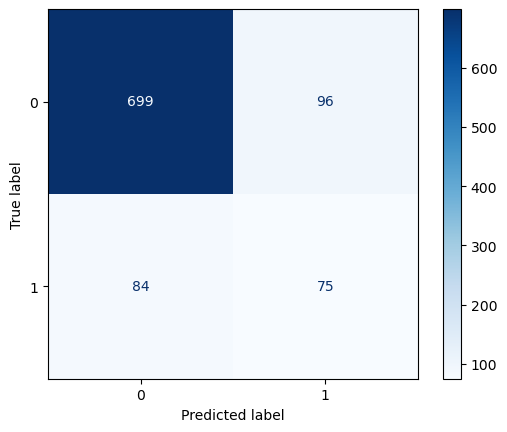

In [65]:
##using confusion matrix 
confusion_mat('Decision Tree Classifier',y_train,tree_train_data_pred)

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Calculate Decision Tree Classifier Accuracy</b></span>

In [66]:
confusion_matrix_tree = np.array([[699, 96], [84, 75]])
dtc_acc_score = calculate_accuracy(confusion_matrix_tree)
print(f"Accuracy of Decision Tree : {dtc_acc_score :.4f}")

Accuracy of Decision Tree : 0.8113


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Decision Tree  Classifier AUC</b></span>

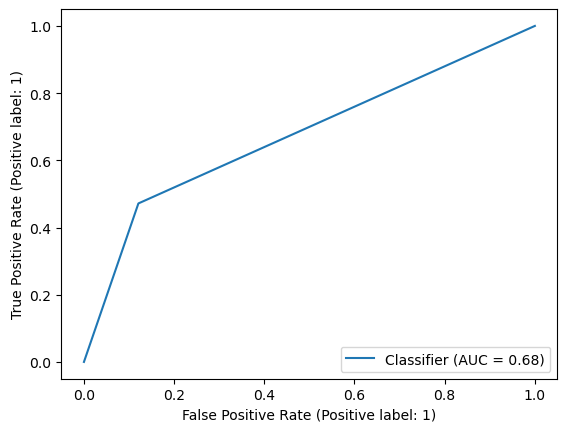


The area under curve for Decesion Tree Classifier is:  0.68


In [67]:
# check the ROC curve as well
RocCurveDisplay.from_predictions(y_train, tree_train_data_pred)
plt.show()
dtc_auc = round(roc_auc_score(y_train, tree_train_data_pred),2)
print(f"\nThe area under curve for Decesion Tree Classifier is: ",dtc_auc)

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
4)SVM</b></span>

In [68]:
# Create an instance of the SVM classifier
svm = SVC(random_state=40)

# Define the parameter grid for Grid Search
svm_param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf','poly','sigmoid'],
    'gamma': ['scale', 'auto']
}

# Perform Grid Search with SVM
svm_recall, svm_best_params = get_best_params(svm,svm_param_grid,X_train, y_train)


Best Hyperparameters: {'C': 10, 'gamma': 'scale', 'kernel': 'linear'}
Best Recall score: 0.4838709677419355


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Predict with  5=>k folds Cross validation</b></span>

In [69]:
# Define the SVC classifier
svm_updated = SVC(random_state=40,**svm_best_params)

#with cross_val_predict (5 k folds)
svm_train_data_pred = cross_val_predict(svm_updated, X_train, y_train, cv=5)


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Evaluate Model Using Confusion Matrix</b></span>

Confusion matrix of: Support Vector Machine(Before Data Augmentation)
Precision score: 64.70588235294117
Recall score: 48.42767295597484
F1 score: 55.39568345323741


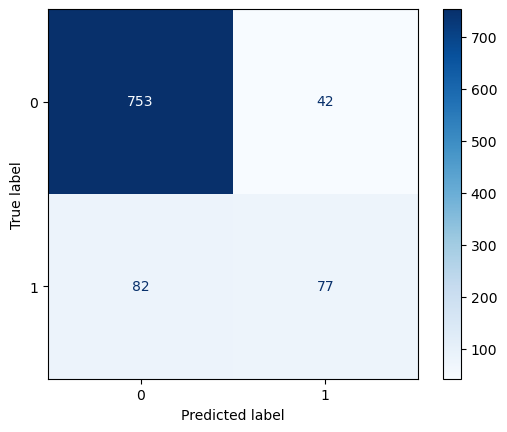

In [70]:
##using confusion matrix 
confusion_mat('Support Vector Machine(Before Data Augmentation)',y_train,svm_train_data_pred )

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Calculate SVM Accuracy</b></span>

In [71]:
confusion_matrix_svm = np.array([[753, 42], [82, 77]])
svm_acc_score = calculate_accuracy(confusion_matrix_svm)

print(f"Accuracy of Support Vector Machine: {svm_acc_score:.4f}")

Accuracy of Support Vector Machine: 0.8700


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Support Vector Machines  AUC</b></span>

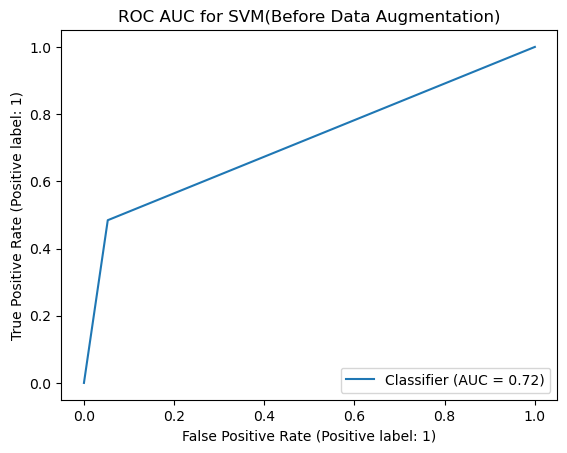


The area under curve for SVM is: 0.72


In [72]:
# check the ROC curve as well
RocCurveDisplay.from_predictions(y_train, svm_train_data_pred)
plt.title("ROC AUC for SVM(Before Data Augmentation)")
plt.show()
svm_auc = round(roc_auc_score(y_train, svm_train_data_pred),2)
print(f"\nThe area under curve for SVM is:",svm_auc)

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Support Vector Machines  Classification Report(Before Data Augentation)</b></span>

In [73]:
svm_creport=classification_report(y_train,svm_train_data_pred)
print("SVM Classification Report (Before Data Augmentation)")
print(svm_creport)

SVM Classification Report (Before Data Augmentation)
              precision    recall  f1-score   support

           0       0.90      0.95      0.92       795
           1       0.65      0.48      0.55       159

    accuracy                           0.87       954
   macro avg       0.77      0.72      0.74       954
weighted avg       0.86      0.87      0.86       954



[//]: <> (1.Introduction)
<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><center><b>Model Accuracy Visualisations<i>(Before Data Augmentation)</i></b><center></div>

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Accuracy Comparison Table</b></span>

In [74]:
acc_scores = [
    {'Algorithim': 'Support Vector Machines[SVM]', 'Accuracy Score(%)': round(svm_acc_score*100,2)},
    {'Algorithim': 'Logistic Regression[LR]', 'Accuracy Score(%)': round (lr_acc_score*100,2)},
    {'Algorithim': 'Random Forest Classifier[RFC]', 'Accuracy Score(%)':round(rfc_acc_score*100,2)},
    {'Algorithim': 'Decision Tree Classifier[DTC]', 'Accuracy Score(%)':round(dtc_acc_score*100,2)}
    ]
df_scores = pd.DataFrame(acc_scores)
df_scores

,Algorithim,Accuracy Score(%)
0,Support Vector Machines[SVM],87.00
1,Logistic Regression[LR],86.58
2,Random Forest Classifier[RFC],85.74
3,Decision Tree Classifier[DTC],81.13


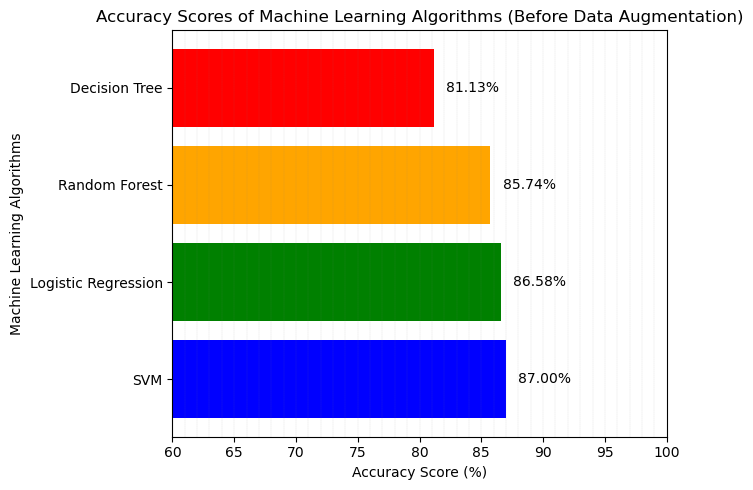

In [75]:
import matplotlib.pyplot as plt

# Data for the bar graph
algorithms = ["SVM", "Logistic Regression", "Random Forest", "Decision Tree"]
accuracy_scores = [87.00, 86.58, 85.74, 81.13]

# Create a horizontal bar graph
plt.figure(figsize=(7, 5))
plt.barh(algorithms, accuracy_scores, color=["blue", "green", "orange", "red"])
plt.ylabel("Machine Learning Algorithms")
plt.xlabel("Accuracy Score (%)")
plt.title("Accuracy Scores of Machine Learning Algorithms (Before Data Augmentation)")
plt.xlim(60, 100)  # Set the x-axis scale to start from 60

# Add labels to the bars
for i, score in enumerate(accuracy_scores):
    plt.text(score + 1, i, f"{score:.2f}%", va="center")

# Add in-between scales
for i in range(61, 100):
    plt.axvline(x=i, color="gray", linestyle="--", linewidth=0.09)

# Show the plot
plt.tight_layout()
plt.show()




> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>AUC Comparison Table</b></span>

In [76]:
auc_scores = [
    {'Algorithim': 'Support Vector Machines[SVM]','AUC':svm_auc},
    {'Algorithim': 'Logistic Regression[LR]','AUC': lr_auc},
    {'Algorithim': 'Decision Tree Classifier[DTC]','AUC':dtc_auc},
    {'Algorithim': 'Random Forest Classifier[RFC]','AUC': rfc_auc},
    ]
df_auc = pd.DataFrame(auc_scores)
df_auc

,Algorithim,AUC
0,Support Vector Machines[SVM],0.72
1,Logistic Regression[LR],0.71
2,Decision Tree Classifier[DTC],0.68
3,Random Forest Classifier[RFC],0.58


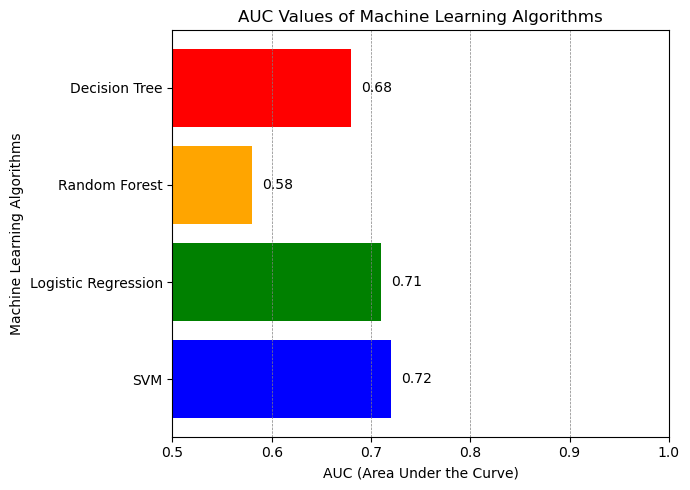

In [77]:
import matplotlib.pyplot as plt

# Data for the bar chart
algorithms = ["SVM", "Logistic Regression", "Random Forest", "Decision Tree"]
auc_values = [0.72, 0.71, 0.58, 0.68]

# Create a horizontal bar chart
plt.figure(figsize=(7, 5))
plt.barh(algorithms, auc_values, color=["blue", "green", "orange", "red"])
plt.xlabel("AUC (Area Under the Curve)")
plt.ylabel("Machine Learning Algorithms")
plt.title("AUC Values of Machine Learning Algorithms")
plt.xlim(0.5, 1.0)  # Set the x-axis scale to start from 0.5

# Add labels to the bars
for i, auc in enumerate(auc_values):
    plt.text(auc + 0.01, i, f"{auc:.2f}", va="center")

# Add in-between scales
for i in range(60, 100, 10):
    plt.axvline(x=i / 100, color="gray", linestyle="--", linewidth=0.5)

# Show the plot
plt.tight_layout()
plt.show()


Accuracy Testing is immediately suitable for the overall assessment of any algorithms in use. However, the metric is not perfectly applicable to imbalanced datasets. <br>
Therefore, ROC AUC (Area under Curve) metrics is brought up alongside to provide more precise insights into the accuracy of the learning model, especially with binary classification one as with the attrition feature of the dataset.

[//]: <> (1.Introduction)
<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><center>Generate Synthetic Data with <span style = 'color: lime' >SMOTE & WCGAN-GP</span></b><center></div><b>

<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;">1)<b>Simple</b> Minority<b> Oversampling Technique</b> (SMOTE)</h2></div>

In [80]:
# Instantiate the SMOTE object
smote = SMOTE()

# Apply SMOTE to the training set
X_train_SMOTE, y_train_SMOTE = smote.fit_resample(X_train, y_train)

print("The Number of Rows in the Dataset is Now",X_train_SMOTE.shape[0])
print("The Number of Rows in the Dataset is Now",y_train_SMOTE.shape[0])

The Number of Rows in the Dataset is Now 1590
The Number of Rows in the Dataset is Now 1590


In [81]:
#the difference in number of rows between the dataset before and after Smote
print("The Dataset had",X_train.shape[0],"Rows Before SMOTE")

a=y_train.shape[0]
b=y_train_SMOTE.shape[0]
c=b-a
print(c, 'Rows where added the Dataset now has',y_train_SMOTE.shape[0] )

The Dataset had 954 Rows Before SMOTE
636 Rows where added the Dataset now has 1590


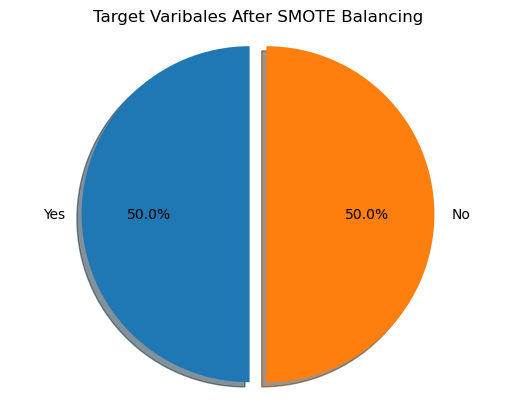

In [82]:
labels = 'Yes', 'No'
sizes = [X_train_SMOTE.shape[0],y_train_SMOTE.shape[0]]
explode = (0, 0.1)

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
shadow=True, startangle=90)
ax1.axis('equal')
plt.title("Target Varibales After SMOTE Balancing")
plt.show()

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Visualizing the new Balanced Data</b></span>

In [83]:
#check the values to ensure that data are balanced
y_train_SMOTE.value_counts()

Attrition
0    795
1    795
Name: count, dtype: int64

<Axes: title={'center': 'Target Varibale Counts After SMOTE'}, xlabel='Attrition', ylabel='count'>

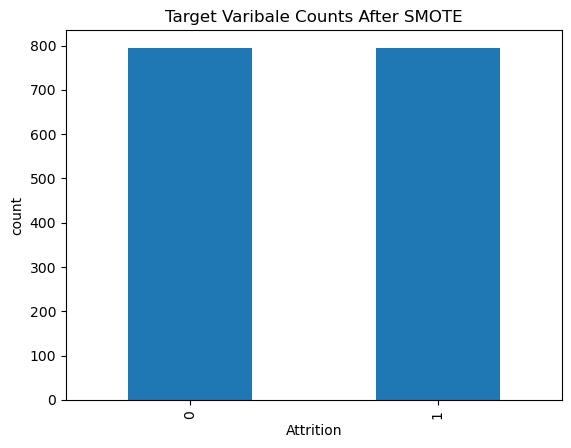

In [84]:
#Plot the values to ensure that data are balanced

y_train_SMOTE.value_counts().plot.bar(title="Target Varibale Counts After SMOTE",ylabel="count")


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Saving the data After SMOTE so as to implement WCGAN-GP
</b></span>

In [85]:
#Saving as Numpy Array
np.save("data/x_train___Smote.npy", X_train_SMOTE)
np.save("data/y_train___Smote.npy", y_train_SMOTE)
np.save("data/x_test.npy", X_test)
np.save("data/y_test.npy", y_test)

In [86]:
#Saving as csv files
X_train_SMOTE.to_csv("data/X_train___Smote-csv.csv", encoding ="utf-8",index=False)
y_train_SMOTE.to_csv("data/y_train___Smote-csv.csv", encoding ="utf-8",index=False)
X_test.to_csv("data/X_test.csv", encoding ="utf-8",index=False)
y_test.to_csv("data/y_test.csv", encoding ="utf-8",index=False)



# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><center><b>WCGAN-GP </b></b><center></div><b>

<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;">1)<b>Load</b> The<b> Data</b> First</h2></div>

In [87]:
x_train = np.load("data/x_train__Smote.npy")
y_train = np.load("data/y_train__Smote.npy")


<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;">2)<b>WCGAN-GP </b> Model<b> Definition</b></h2></div>

In [88]:
class RandomWeightedAverage(tf.keras.layers.Layer):
    """Provides a (random) weighted average between real and generated samples"""
    
    def __init__(self, batch_size):
        super().__init__()
        self.batch_size = batch_size
    
    def call(self, inputs, **kwargs):
        alpha = tf.random.uniform((self.batch_size, 1))
        return (alpha * inputs[0]) + ((1 - alpha) * inputs[1])
    
    def compute_output_shape(self, input_shape):
        return input_shape[0]

class WCGANGP():
    def __init__(self, 
                 x_train, 
                 y_train, 
                 latent_dim: int, 
                 batch_size: int,
                 n_critic: int):
        """Implement WCGAN with Gradient Penalty.
        
        Most of the hyperparameteres were taken from this paper:
        https://www.researchgate.net/publication/347437993_Synthesising_Tabular_Data_using_Wasserstein_Conditional_GANs_with_Gradient_Penalty_WCGAN-GP
        
        and from the Improved WGAN paper:
        https://arxiv.org/abs/1704.00028
        
        Attributes
        ---------
        x_train : numpy.ndarray
            Real data without labels used for training.
            (Created with sklearn.model_selection.train_test_split
        
        y_train : numpy.ndarray
            Real data labels.
            
        data_dim : int
            Data dimension. Number of columns in `x_train`.
            
        latent_dim : int
            Dimension of random noise vector (z), used for training
            the generator.
            
        batch_size : int
            Size of training batch in each epoch.
        
        n_critic : int
            Number of times the critic (discriminator) will be trained
            in each epoch.

        """
        
        self.x_train = x_train
        self.y_train = y_train
        
        self.num_classes = len(np.unique(y_train))
        self.data_dim = x_train.shape[1]
        
        self.latent_dim = latent_dim
        self.batch_size = batch_size
        
        self.n_critic = n_critic
        
        # Log training progress.
        self.losslog = []

        # Adam optimizer, suggested by original paper.
        optimizer = Adam(learning_rate=0.0005, beta_1=0.05, beta_2=0.9)

        # Build the generator and critic
        self.generator = self.build_generator()
        self.critic = self.build_critic()

        
        #-------------------------------
        # Construct Computational Graph
        #       for the Critic
        #-------------------------------

        # Freeze generator's layers while training critic.
        self.generator.trainable = False

        # Data input (real sample).
        real_data = Input(shape=self.data_dim)
        # Noise input (z).
        noise = Input(shape=(self.latent_dim,))
        # Label input.
        label = Input(shape=(1,))
        
        # Generate data based of noise (fake sample)
        fake_data = self.generator([noise, label])
        
        # Critic (discriminator) determines validity of the real and fake images.
        fake = self.critic([fake_data, label])
        valid = self.critic([real_data, label])
        
        # Construct weighted average between real and fake images.
        interpolated_data = RandomWeightedAverage(self.batch_size)([real_data, fake_data])
        
        # Determine validity of weighted sample.
        validity_interpolated = self.critic([interpolated_data, label])
        
        
        # Use Python partial to provide loss function with additional
        # 'averaged_samples' argument.
        partial_gp_loss = partial(self.gradient_penalty_loss,
                          averaged_samples=interpolated_data)
        # Keras requires function names.
        partial_gp_loss.__name__ = 'gradient_penalty' 
        
        self.critic_model = Model(inputs=[real_data, label, noise],
                            outputs=[valid, fake, validity_interpolated])
        
        self.critic_model.compile(loss=[self.wasserstein_loss,
                                        self.wasserstein_loss,
                                        partial_gp_loss],
                                  optimizer=optimizer,
                                  loss_weights=[1, 1, 10])
 
        #-------------------------------
        # Construct Computational Graph
        #         for Generator
        #-------------------------------

        # For the generator we freeze the critic's layers.
        self.critic.trainable = False
        self.generator.trainable = True

        # Sampled noise for input to generator.
        noise = Input(shape=(self.latent_dim,))
        
        # Add label to input.
        label = Input(shape=(1,))
        
        # Generate data based of noise.
        fake_data = self.generator([noise, label])

        # Discriminator determines validity.
        valid = self.critic([fake_data, label])

        # Define generator model.
        self.generator_model = Model([noise, label], valid)
        self.generator_model.compile(loss=self.wasserstein_loss, 
                                     optimizer=optimizer)


    def gradient_penalty_loss(self, y_true, y_pred, averaged_samples):
        """
        Computes gradient penalty based on prediction and weighted real / fake samples
        """
        gradients = K.gradients(y_pred, averaged_samples)[0]
        
        # compute the euclidean norm by squaring ...
        gradients_sqr = K.square(gradients)
        #   ... summing over the rows ...
        gradients_sqr_sum = K.sum(gradients_sqr,
                                  axis=np.arange(1, len(gradients_sqr.shape)))
        #   ... and sqrt
        gradient_l2_norm = K.sqrt(gradients_sqr_sum)
        
        # compute lambda * (1 - ||grad||)^2 still for each single sample
        gradient_penalty = K.square(1 - abs(gradient_l2_norm))
        
        # return the mean as loss over all the batch samples
        return K.mean(gradient_penalty)


    def wasserstein_loss(self, y_true, y_pred):
        """Computes Wasserstein loss from real and fake predictions."""
        return K.mean(y_true * y_pred)

    def build_generator(self):

        model = Sequential(name="Generator")
        
        # First hidden layer.
        model.add(Dense(256, input_dim=self.latent_dim))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.3))
        
        # Second hidden layer.
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.3))
        
        # Third hidden layer.
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dropout(0.3))
        
        # Output layer.
        model.add(Dense(self.data_dim, activation="tanh"))
        
        model.summary()
        
        # Noise and label input layers.
        noise = Input(shape=(self.latent_dim,))
        label = Input(shape=(1,), dtype="int32")
        
        # Embed labels into onehot encoded vectors.
        label_embedding = Flatten()(Embedding(self.num_classes, self.latent_dim)(label))
        
        # Multiply noise and embedded labels to be used as model input.
        model_input = multiply([noise, label_embedding])
        
        generated_data = model(model_input)

        return Model([noise, label], generated_data, name="Generator")

    def build_critic(self):

        model = Sequential(name="Critic")

        # First hidden layer.
        model.add(Dense(1024, input_dim=self.data_dim))
        model.add(LeakyReLU(alpha=0.2))
        
        # Second hidden layer.        
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        
        # Third hidden layer.
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))

        # Output layer with linear activation.
        model.add(Dense(1))

        model.summary()
        
        # Artificial data input.
        generated_sample = Input(shape=self.data_dim)
        # Label input.
        label = Input(shape=(1,), dtype="int32")
        
        # Embedd label as onehot vector.
        label_embedding = Flatten()(Embedding(self.num_classes, self.data_dim)(label))
        
        # Multiply fake data sample with label embedding to get critic input.
        model_input = multiply([generated_sample, label_embedding])
        
        validity = model(model_input)

        return Model([generated_sample, label], validity, name="Critic")

    def train(self, epochs):

        # Adversarial ground truths.
        valid = -(np.ones((self.batch_size, 1)))
        fake =  np.ones((self.batch_size, 1))
        dummy = np.zeros((self.batch_size, 1))
        
        # Number of batches.
        self.n_batches = math.floor(self.x_train.shape[0] / self.batch_size)

        overhead = self.x_train.shape[0] % self.batch_size
        
        for epoch in range(epochs):
                
            # Reset training set.
            self.x_train = x_train.copy()
            self.y_train = y_train.copy()

            # Select random overhead rows that do not fit into batches.
            rand_overhead_idx = np.random.choice(range(self.x_train.shape[0]), overhead, replace=False)

            # Remove random overhead rows.
            self.x_train = np.delete(self.x_train, rand_overhead_idx, axis=0)
            self.y_train = np.delete(self.y_train, rand_overhead_idx, axis=0)

            # Split training data into batches.
            x_batches = np.split(self.x_train, self.n_batches)
            y_batches = np.split(self.y_train, self.n_batches)
            
            for x_batch, y_batch, i in zip(x_batches, y_batches, range(self.n_batches)):
        
                for _ in range(self.n_critic):

                    # ---------------------
                    #  Train Critic
                    # ---------------------

                    # Generate random noise.
                    noise = np.random.normal(0, 1, (self.batch_size, self.latent_dim))
                             
                    # Train the critic.
                    d_loss = self.critic_model.train_on_batch(
                        [x_batch, y_batch, noise],                                      
                        [valid, fake, dummy])


                # ---------------------
                #  Train Generator
                # ---------------------

                # Generate sample of artificial labels.
                generated_labels = np.random.randint(0, self.num_classes, self.batch_size).reshape(-1, 1)

                # Train generator.
                g_loss = self.generator_model.train_on_batch([noise, generated_labels], valid)


                # ---------------------
                #  Logging
                # ---------------------

                self.losslog.append([d_loss[0], g_loss])
                
                DLOSS = "%.4f" % d_loss[0]
                GLOSS = "%.4f" % g_loss
                
                if i % 100 == 0:
                    print(f"{epoch} - {i}/{self.n_batches} \t [D loss: {DLOSS}] [G loss: {GLOSS}]")


<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;">3)<b>Model</b> Training<b></b></h2></div>


In [ ]:
wcgan = WCGANGP(
    x_train, 
    y_train,
    latent_dim=64,
    batch_size=256,
    n_critic=5)

wcgan.train(epochs=15)


Model: "Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               16640     
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 256)               0         
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 512)               131584    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 512)               0         
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 1024)              5

8 - 300/959 	 [D loss: -0.1838] [G loss: -1.6777]
8 - 400/959 	 [D loss: -0.1917] [G loss: -1.6814]
8 - 500/959 	 [D loss: -0.1797] [G loss: -1.8053]
8 - 600/959 	 [D loss: -0.2110] [G loss: -1.6374]
8 - 700/959 	 [D loss: -0.2155] [G loss: -1.6404]
8 - 800/959 	 [D loss: -0.2056] [G loss: -1.6901]
8 - 900/959 	 [D loss: -0.1907] [G loss: -1.6266]
9 - 0/959 	 [D loss: -0.1797] [G loss: -1.5407]
9 - 100/959 	 [D loss: -0.1741] [G loss: -1.5194]
9 - 200/959 	 [D loss: -0.1979] [G loss: -1.5719]
9 - 300/959 	 [D loss: -0.1872] [G loss: -1.6625]
9 - 400/959 	 [D loss: -0.1658] [G loss: -1.6154]
9 - 500/959 	 [D loss: -0.1818] [G loss: -1.5426]
9 - 600/959 	 [D loss: -0.2007] [G loss: -1.5823]
9 - 700/959 	 [D loss: -0.1946] [G loss: -1.4892]
9 - 800/959 	 [D loss: -0.1946] [G loss: -1.5846]
9 - 900/959 	 [D loss: -0.1683] [G loss: -1.6369]
10 - 0/959 	 [D loss: -0.2098] [G loss: -1.6438]
10 - 100/959 	 [D loss: -0.1800] [G loss: -1.5085]
10 - 200/959 	 [D loss: -0.1732] [G loss: -1.4757]
1

# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><b><center>Synthetic Data Evaluation</center></b>
<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;">Evaluating <b>"Synthetic Data"</b>   was done using the [TableEvaluator](https://pypi.org/project/table-evaluator/) which is - _"A package to evaluate how close a <b>"Synthetic Dataset"</b> is to <b>real data</b>."_  </div>
    
Evaluation process was done as follows:
<ul>
	<li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Create fake labels with the same distribution          ratios as real labels.</b></span></li>
	<li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Use fake labels to generate synthetic data.</b></span></li>
        <li><span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Compare real vs. synthetic data using          TableEvaluator</b></span></li>
</ul>

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Creating Fake Labels
</b></span>

In [ ]:
label_ratios = { label:len(y_train[y_train == label])/y_train.shape[0] for label in np.unique(y_train) }

label_ratios

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Using Fake Labels to Generate Synthetic Data
</b></span>

In [ ]:
#function to generate  synthetic data
def generate_samples(n: int, latent_dim: int):
    """Use WCGAN to generate new data."""
    noise = np.random.normal(0, 1, (n, latent_dim))
    
    # Create sampled labels.
    sampled_labels = [
        np.full(round(ratio*n), label).tolist()
        for label, ratio in label_ratios.items()
    ]
    
    # Convert list to numpy array.
    sampled_labels = np.array((list(itertools.chain(*sampled_labels))))

    # Use CGAN to generate aritficial data.
    return wcgan.generator.predict([noise, sampled_labels])

In [ ]:
generated_samplesx = generate_samples(x_train.shape[0], wcgan.latent_dim)
generated_samplesy = generate_samples(y_train.shape[0], wcgan.latent_dim)

In [ ]:
#real x_train samples
real_samples = pd.DataFrame(x_train)

<h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;">3)<b>Table</b> Evaluator<b></b></h2></div>


In [ ]:
table_evaluator = TableEvaluator(
    real_samples, 
    pd.DataFrame(generated_samplesx)
)

In [ ]:
X_train = pd.DataFrame(generated_samplesx)
X_train.shape

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Table Evaluator Visualisation
</b></span>

In [ ]:
table_evaluator.visual_evaluation()

In [ ]:
table_evaluator.evaluate(target_col='trans_type')

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Critic Loss vs Generator Loss</b></span> 

In [ ]:
plt.figure(figsize=(15,10))
plt.plot(wcgan.losslog)
plt.title("WCGANGP Losses")
plt.xlabel("Batches")
plt.ylabel("Loss")
plt.legend(['Critic loss', 'Generator loss'])

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Saving The generated samples</b></span> 

In [95]:
X_train = generated_samplesx
y_train = generated_samplesy

#as csv
X_train = pd.DataFrame(X_train)
y_train = pd.DataFrame(y_train)
X_train.to_csv("data/X_train__Aug.csv", encoding ="utf-8",index=False)
y_train.to_csv("data/y_train__Aug.csv", encoding ="utf-8",index=False)

### Conclusion

When inspecting evaluation results we can see that most metrics show great results, but do leave some place for improvement. 

All in all it was shown that WCGAN-GP is capable of creating beliveable synthetic data, which no doubt can be driven to state of the art levels with further adjustments of pre-processing steps, fine tuning of hyperparameters and longer training periods.

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Saving The Models</b></span> 

In [96]:
wcgan.generator.save("models/generator.h5")
wcgan.critic.save("models/critic.h5")

[//]: <> (1.Introduction)
<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><center><b>Training ML Models<i>(After Data Augmentation)</i></b><center><h2 style="font-family: Verdana; font-size: 25px; font-style: normal; font-weight: normal; text-decoration: none; text-transform: none; letter-spacing: 2px; color: #155D07; background-color: #ffffff;"><center>[Logistic Regression / Random Forest / SVM / DecisionTree] </h2></center></div>

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Import the final data first</b></span>

In [97]:
X_train_Aug = pd.read_csv('data/x_train_Aug.csv')
y_train_Aug = pd.read_csv('data/y_train_Aug.csv')
X_test_Aug = pd.read_csv('data/x_train_Aug.csv')
y_test_Aug = pd.read_csv('data/y_train_Aug.csv')

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>1)Logistic Regression <i>[After Data Augmentation]</i></b></span> 

In [98]:

# Since the model is defined already we Get the best hyperparameter values with augmentated training data
logit_Aug_recall, logit_Aug_best_params = get_best_params(logit,logit_param_grid,X_train,y_train)

ValueError: 
All the 30 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
6 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py", line 1196, in fit
    X, y = self._validate_data(
           ^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py", line 584, in _validate_data
    X, y = check_X_y(X, y, **check_params)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py", line 1122, in check_X_y
    y = _check_y(y, multi_output=multi_output, y_numeric=y_numeric, estimator=estimator)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py", line 1143, in _check_y
    y = column_or_1d(y, warn=True)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py", line 1202, in column_or_1d
    raise ValueError(
ValueError: y should be a 1d array, got an array of shape (196492, 33) instead.

--------------------------------------------------------------------------------
24 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\sklearn\linear_model\_logistic.py", line 1196, in fit
    X, y = self._validate_data(
           ^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py", line 584, in _validate_data
    X, y = check_X_y(X, y, **check_params)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py", line 1122, in check_X_y
    y = _check_y(y, multi_output=multi_output, y_numeric=y_numeric, estimator=estimator)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py", line 1143, in _check_y
    y = column_or_1d(y, warn=True)
        ^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\USER\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\validation.py", line 1202, in column_or_1d
    raise ValueError(
ValueError: y should be a 1d array, got an array of shape (196493, 33) instead.


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Logistic Regression Predict with 5 k Folds<i> [After Data Augmentation]</i></b></span> 

In [ ]:
logit_Aug= LogisticRegression(solver='liblinear',**logit_Aug_best_params )
#with cross_val_predict (5 k folds)
logit_train_Aug_data_pred = cross_val_predict(logit_Aug,X_train_Aug, y_train_Aug, cv=5)


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Model Evaluation with Confusion Matrix <i>[After Data Augmentation]</i></b></span> 

In [ ]:
confusion_mat("Logistic Regression with Augmented  Data",y_train_Aug,logit_train_Aug_data_pred)

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Calculation Accuracy of Logistic Regression <i>[After Data Augmentation]</i></b></span> 

In [ ]:
confusion_matrix_logit_smote = np.array([[633, 162], [125, 670]])
lg_aug_acc_score = calculate_accuracy(confusion_matrix_logit_smote)

print(f"Accuracy: {lg_aug_acc_score:.4f}")

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Logistic Regression AUC <i>[After Data Augmentation]</i></b></span> 

In [ ]:
# check the ROC curve as well
RocCurveDisplay.from_predictions(y_train_Aug, logit_train_Aug_data_pred)
plt.show()
lg_aug_auc = round(roc_auc_score(y_train_Aug, logit_train_Aug_data_pred),2)
print(f"\nThe area under curve for Logistic regression after Data  Augmentation is: ",lg_aug_auc)

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>2)Random Forest  <i>[After Data Augmentation]</i></b></span> 

In [ ]:
import warnings
warnings. filterwarnings('ignore')
# Perform grid search with recall scoring for XGBoost
forest_Aug_recall, forest_Aug_best_params = get_best_params(forest,forest_param_grid,X_train_Aug,y_train_Aug)


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Random Forests Predict with 5 k Folds<i> [After Data Augmentation]</i></b></span> 

In [ ]:
forest_Aug= RandomForestClassifier(random_state=40,**forest_Aug_best_params)
#with cross_val_predict (5 k folds)
forest_train_Aug_data_pred = cross_val_predict(forest_Aug,X_train_Aug, y_train_Aug, cv=5)

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Evaluate Model Using Confusion Matrix</b></span>

Confusion matrix of: Random Forest with Augmented Data
Precision score: 90.46997389033943
Recall score: 87.16981132075472
F1 score: 88.78923766816142


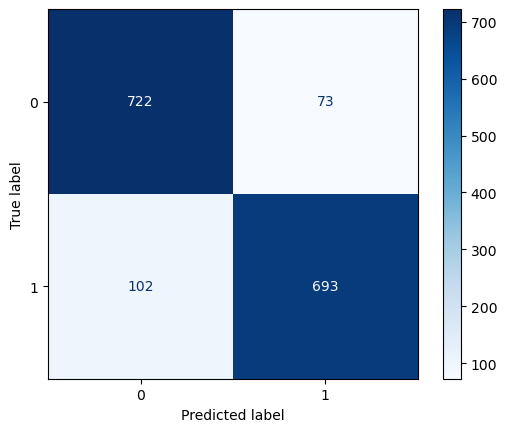

In [96]:
confusion_mat("Random Forest with Augmented Data",y_train_Aug,forest_train_Aug_data_pred)

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Calculating Accuracy of Random Forest <i>[After Data Augmentantion]</i></b></span>

In [97]:
confusion_matrix_forest_smote = np.array([[722, 73], [102, 693]])
rf_aug_acc_score = calculate_accuracy(confusion_matrix_forest_smote)
print(f" The Accuracy of Random Forest With Augemnent data is: {rf_aug_acc_score:.4f}")

 The Accuracy of Random Forest With Augemnent data is: 0.8899


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Random Forest AUC <i>[After Data Augmentation]</i></b></span> 

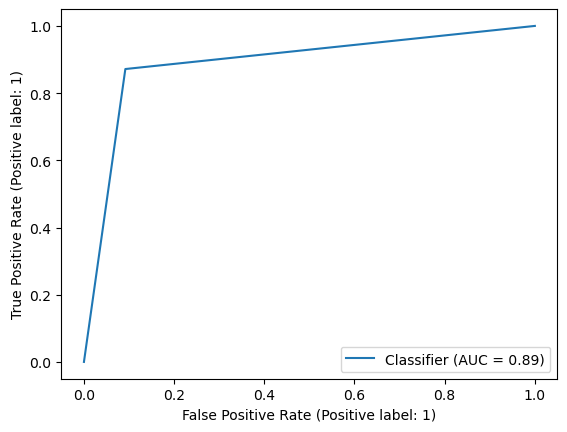


The area under curve for SVM is:  


In [98]:
# check the ROC curve as well
RocCurveDisplay.from_predictions(y_train_Aug, forest_train_Aug_data_pred)
plt.show()
rf_aug_auc =round(roc_auc_score(y_train_Aug, forest_train_Aug_data_pred),2)
print(f"\nThe area under curve for SVM is:  ")

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>3)Decision Trees <i>[After Data Augmentation]</i></b></span>

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Parameter Tuning</b></span> 

In [99]:
# Perform grid search with recall scoring for tree
tree_Aug_recall, tree_Aug_best_params = get_best_params(tree,tree_param_grid,X_train_Aug,y_train_Aug)

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2}
Best Recall score: 0.8830188679245282


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Decision Trees Predict with 5 k Folds<i> [After Data Augmentation]</i></b></span> 

In [100]:
tree_Aug= DecisionTreeClassifier(random_state=40,**tree_Aug_best_params)

#with cross_val_predict (5 k folds)
tree_train_Aug_data_pred = cross_val_predict(tree_Aug,X_train_Aug, y_train_Aug, cv=5)

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Evaluating the Model with Confusin Matrix</b></span> 

Confusion matrix of: Decision Trees with SMOTE data
Precision score: 87.09677419354838
Recall score: 88.30188679245283
F1 score: 87.6951905059338


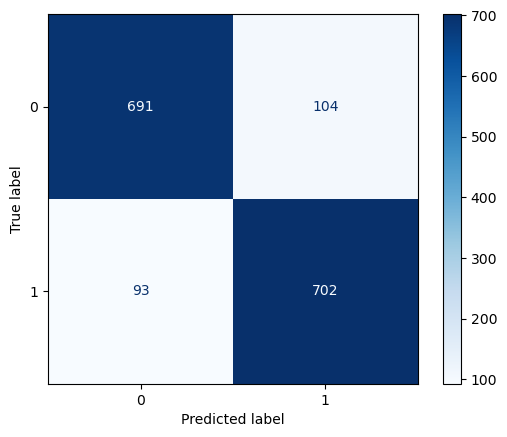

In [101]:
confusion_mat("Decision Trees with SMOTE data",y_train_Aug,tree_train_Aug_data_pred)

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Calculating Accuracy of Decision Trees <i>[After Data Augmentantion]</i></b></span>

In [102]:
confusion_matrix_tree_smote = np.array([[691,104], [93, 702]])
dt_aug_acc_score = calculate_accuracy(confusion_matrix_tree_smote)

print(f" The Accuracy of Decision Trees With Augemnent data is: {dt_aug_acc_score:.4f}")

 The Accuracy of Decision Trees With Augemnent data is: 0.8761


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Decision Trees AUC <i>[After Data Augmentation]</i></b></span> 

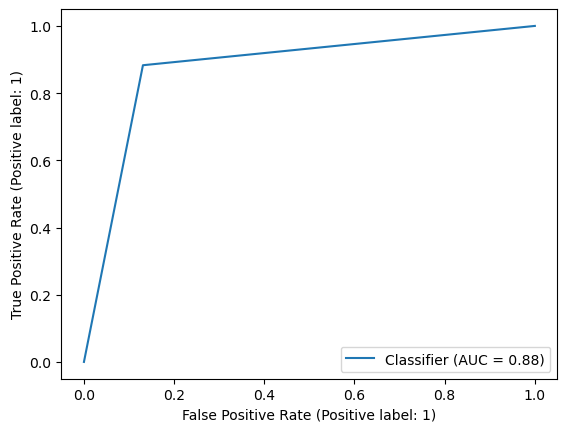


The area under curve for Decision Trees After Data Augmentation is:  0.88


In [103]:
#check the ROC curve as well
RocCurveDisplay.from_predictions(y_train_Aug, tree_train_Aug_data_pred)

plt.show()
tree_aug_auc = round(roc_auc_score(y_train_Aug, tree_train_Aug_data_pred),2)
print(f"\nThe area under curve for Decision Trees After Data Augmentation is: ",tree_aug_auc)

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>4)Support Vector Machines (Svm) <i>[After Data Augmentation]</i></b></span>

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Parameter Tuning</b></span>

In [104]:
# Perform Grid Search with SVM
svm_Aug_recall, svm_Aug_best_params = get_best_params(svm,svm_param_grid,X_train_Aug, y_train_Aug)

Best Hyperparameters: {'C': 10, 'gamma': 'scale', 'kernel': 'poly'}
Best Recall score: 0.9962264150943396


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>SVM Predict with 5 k Folds<i> [After Data Augmentation]</i></b></span> 

In [105]:
# Define the SVM classifier
svm_Aug = SVC(random_state=40,**svm_Aug_best_params)

#with cross_val_predict (5 k folds)
svm_train_Aug_data_pred = cross_val_predict(svm_Aug,X_train_Aug, y_train_Aug, cv=5)

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Evaluating the Model with Confusin Matrix</b></span> 

Confusion matrix of: Support Vector Machine With Aumented Data
Precision score: 88.09788654060067
Recall score: 99.62264150943396
F1 score: 93.5064935064935


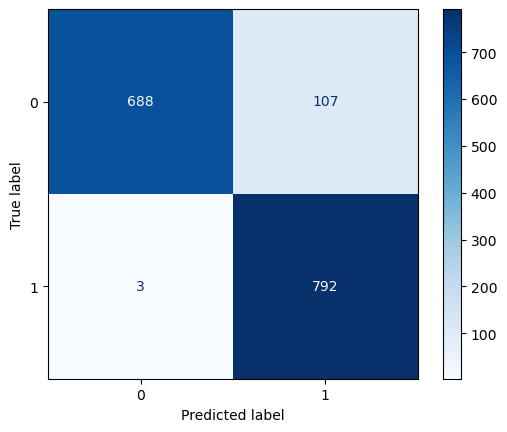

In [106]:

##using confusion matrix 
confusion_mat('Support Vector Machine With Aumented Data',y_train_Aug,svm_train_Aug_data_pred )

In [107]:
confusion_matrix_tree_smote = np.array([[694,101], [2, 793]])
svm_aug_acc_score = calculate_accuracy(confusion_matrix_tree_smote)

print(f"The Accuracy Of Support Vector Machines After Data Augmentation is: {svm_aug_acc_score:.4f}")

The Accuracy Of Support Vector Machines After Data Augmentation is: 0.9352



> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>SVM model  after Augmentation reaches the highest  accuracy score till now</b></span>

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Support Vector Machines(SVM) AUC <i>[After Data Augmentation]</i></b></span> 

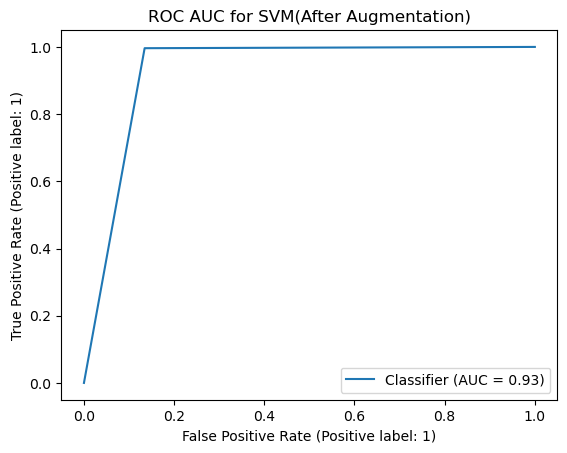


The area under curve for Decision Trees After Data Augmentation is:  0.93


In [108]:
#check the ROC curve as well
RocCurveDisplay.from_predictions(y_train_Aug, svm_train_Aug_data_pred)
plt.title("ROC AUC for SVM(After Augmentation)")
plt.show(2)
svm_aug_auc =round(roc_auc_score(y_train_Aug, svm_train_Aug_data_pred),2)
print(f"\nThe area under curve for Decision Trees After Data Augmentation is: ",svm_aug_auc )

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>
Support Vector Machines  Classification Report(After Data Augentation)</b></span>

In [109]:
svm_Aug_creport=classification_report(y_train_Aug,svm_train_Aug_data_pred)
print("Classification Report (After Data Augmentation)")
print(svm_Aug_creport)

Classification Report (After Data Augmentation)
              precision    recall  f1-score   support

           0       1.00      0.87      0.93       795
           1       0.88      1.00      0.94       795

    accuracy                           0.93      1590
   macro avg       0.94      0.93      0.93      1590
weighted avg       0.94      0.93      0.93      1590



[//]: <> (1.Introduction)
<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><center><b>Model Accuracy Visualisations<i>(After Data Augmentation)</i></b><center></div>

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Accuracy Comparison Table</b></span>

In [ ]:
acc_scores = [
    {'Algorithim': 'Support Vector Machines[SVM]', 'Accuracy Score(%)': round(svm_aug_acc_score*100,2)},
    {'Algorithim': 'Random Forest Classifier[RFC]', 'Accuracy Score(%)':round(rf_aug_acc_score*100,2)},
    {'Algorithim': 'Decision Tree Classifier[DTC]', 'Accuracy Score(%)':round(dt_aug_acc_score*100,2)},
    {'Algorithim': 'Logistic Regression[LR]', 'Accuracy Score(%)': round (lg_aug_acc_score*100,2)},
    ]
df_scores = pd.DataFrame(acc_scores)
df_scores

In [ ]:
import matplotlib.pyplot as plt

# Data for the bar graph
algorithms = ["SVM", "Logistic Regression", "Random Forest", "Decision Tree"]
accuracy_scores = [93.52, 81.95, 88.99, 87.61]

# Create a horizontal bar graph
plt.figure(figsize=(7, 5))
plt.barh(algorithms, accuracy_scores, color=["blue", "green", "orange", "red"])
plt.ylabel("Machine Learning Algorithms")
plt.xlabel("Accuracy Score (%)")
plt.title("Accuracy Scores of Machine Learning Algorithms (Before Data Augmentation)")
plt.xlim(60, 100)  # Set the x-axis scale to start from 60

# Add labels to the bars
for i, score in enumerate(accuracy_scores):
    plt.text(score + 1, i, f"{score:.2f}%", va="center")

# Add in-between scales
for i in range(61, 100):
    plt.axvline(x=i, color="gray", linestyle="--", linewidth=0.09)

# Show the plot
plt.tight_layout()
plt.show()



> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>AUC Comparison Table</b></span>

In [ ]:
auc_scores = [
    {'Algorithim': 'Support Vector Machines[SVM]','AUC':svm_aug_auc},
    {'Algorithim': 'Logistic Regression[LR]','AUC': rf_aug_auc},
    {'Algorithim': 'Random Forest Classifier[RFC]','AUC':tree_aug_auc},
    {'Algorithim': 'Decision Tree Classifier[DTC]','AUC': lg_aug_auc},
  
    ]
df_auc = pd.DataFrame(auc_scores)
df_auc

In [ ]:
import matplotlib.pyplot as plt

# Data for the bar chart
algorithms = ["SVM", "Logistic Regression", "Random Forest", "Decision Tree"]
auc_values = [0.93, 0.89, 0.88, 0.82]

# Create a horizontal bar chart
plt.figure(figsize=(7, 5))
plt.barh(algorithms, auc_values, color=["blue", "green", "orange", "red"])
plt.xlabel("AUC (Area Under the Curve)")
plt.ylabel("Machine Learning Algorithms")
plt.title("AUC Values of Machine Learning Algorithms")
plt.xlim(0.5, 1.0)  # Set the x-axis scale to start from 0.5

# Add labels to the bars
for i, auc in enumerate(auc_values):
    plt.text(auc + 0.01, i, f"{auc:.2f}", va="center")

# Add in-between scales
for i in range(60, 100, 10):
    plt.axvline(x=i / 100, color="gray", linestyle="--", linewidth=0.5)

# Show the plot
plt.tight_layout()
plt.show()

[//]: <> (1.Introduction)
<a id="1"></a>
# <div style="padding:20px;color:white;margin:0;font-size:35px;font-family:Georgia;text-align:left;display:fill;border-radius:5px;background-color:#254E58;overflow:hidden"><center><b>Comparisons<i>(Before and AFter Data Augmentation)</i></b><center></div>

> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>Accuracy  Comparison Table</b></span>

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data for the bar chart (two sets of accuracy scores)
algorithms = ["SVM", "Logistic Regression", "Random Forest", "Decision Tree"]
scores_set1 = [87.00, 86.58, 85.74, 81.13]
scores_set2 = [93.52, 81.95, 88.99, 93.52]

# Set the width of the bars
bar_width = 0.35

# Create positions for the bars
positions = np.arange(len(algorithms))

# Create the bar chart
plt.figure(figsize=(10, 6))
plt.bar(positions - bar_width/2, scores_set1, bar_width, label="Before Augmentation", color="blue")
plt.bar(positions + bar_width/2, scores_set2, bar_width, label="After Augmentation", color="orange")

# Customize the plot
plt.xlabel("Machine Learning Algorithms")
plt.ylabel("Accuracy Score (%)")
plt.title("Comparison of Accuracy Scores for Two Before and After Data Augmentation")
plt.xticks(positions, algorithms)
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()



In [ ]:
import matplotlib.pyplot as plt

# Sample data
algorithms = ["SVM", "Logistic Regression", "Random Forest", "Decision Tree"]
dataset1 = [87.00, 86.58, 85.74, 81.13]
dataset2 = [93.52, 81.95, 88.99, 93.52]


# Create the line chart
plt.plot(algorithms, dataset1, marker='o', label='Before Data Augmentation')
plt.plot(algorithms, dataset2, marker='s', label='After Data Augmentation')

# Add labels and title
plt.xlabel("Algorithms")
plt.ylabel("Percentage Value (%)")
plt.title("Comparison of Percentage Accuracy Before and after Augmentation")

# Add legend
plt.legend()

# Show the plot
plt.grid(True)
plt.show()


> <span style='font-size:15px; font-family:Verdana;color: #254E58;'><b>AUC Comparison</b></span>

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data for two datasets
dataset1_values = [0.72, 0.71, 0.68, 0.58]
dataset2_values = [0.93, 0.89, 0.88, 0.82]

# Labels for the x-axis (algorithm names)
algorithms = ['SVM', 'Logistic Regression', 'Decision Tree', 'Random Forest']

# Set the width of the bars
bar_width = 0.35

# Create an array of indices for the x-axis
x = np.arange(len(algorithms))

# Create the bar plots for both datasets
plt.bar(x - bar_width/2, dataset1_values, bar_width, label='Before Data Augmentation')
plt.bar(x + bar_width/2, dataset2_values, bar_width, label='After Data Augmentation')

# Add labels and title
plt.xlabel('Algorithms')
plt.ylabel('AUC Value')
plt.title('Comparison of AUC Values Before and After Augmentation')
plt.xticks(x, algorithms)
plt.legend()

# Show the plot
plt.show()



In [ ]:

# Create dummy data for two datasets
data = {
    'Algorithm': ['SVM', 'Logistic Regression', 'Decision Tree', 'Random Forest'],
    'Dataset 1': [0.72, 0.71, 0.68, 0.58],
    'Dataset 2': [0.93, 0.89, 0.88, 0.82]
}

# Create a DataFrame
df = pd.DataFrame(data)

# Set the figure size
plt.figure(figsize=(10, 6))

# Plot the line chart
plt.plot(df['Algorithm'], df['Dataset 1'], marker='o', label='Before Data Augmentation', color='blue')
plt.plot(df['Algorithm'], df['Dataset 2'], marker='s', label='After Data Augmentation', color='orange')

# Add labels and title
plt.xlabel('Algorithm')
plt.ylabel('AUC Value')
plt.title('Comparison of AUC Values between Dataset 1 and Dataset 2')
plt.grid(True)

# Add legend
plt.legend()

# Show the plot
plt.show()

